let's import all the packages

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy
from sklearn import *
import statsmodels.api as sm
import networkx as nx
import requests
from flask import Flask
import sqlalchemy
import pytest
import tkinter as tk
import openpyxl

Since i was facing issues uploading the dataset, i will be using utf-8 encoding to be compatible with all ASCII values for removinf parser errors

In [3]:
import pandas as pd
medicalinsurancedata = pd.read_csv('https://github.com/dsrscientist/dataset4/raw/main/medical_cost_insurance.csv', encoding='utf-8')
medicalinsurancedata

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830
1334,18,female,31.920,0,no,northeast,2205.98080
1335,18,female,36.850,0,no,southeast,1629.83350
1336,21,female,25.800,0,no,southwest,2007.94500


The main purpose of medical insurance is to receive the best medical care without any strain on your finances. Health insurance plans offer protection against high medical costs. It covers hospitalization expenses, day care procedures, domiciliary expenses, and ambulance charges, besides many others. Based on certain input features such as age , bmi,,no of dependents ,smoker ,region  medical insurance is calculated .

Columns                                            
•	age: age of primary beneficiary
•	sex: insurance contractor gender, female, male
•	bmi: Body mass index, providing an understanding of body, weights that are relatively high or low relative to height, objective index of body weight (kg / m ^ 2) using the ratio of height to weight, ideally 18.5 to 24.9.
•	children: Number of children covered by health insurance / Number of dependents
•	smoker: Smoking
•	region: the beneficiary's residential area in the US, northeast, southeast, southwest, northwest.
•	charges: Individual medical costs billed by health insurance


In [4]:
medicalinsurancedata.head(30)

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
5,31,female,25.740,0,no,southeast,3756.62160
6,46,female,33.440,1,no,southeast,8240.58960
7,37,female,27.740,3,no,northwest,7281.50560
8,37,male,29.830,2,no,northeast,6406.41070
9,60,female,25.840,0,no,northwest,28923.13692


In [5]:
medicalinsurancedata.tail(30)

,age,sex,bmi,children,smoker,region,charges
1308,25,female,30.200,0,yes,southwest,33900.65300
1309,41,male,32.200,2,no,southwest,6875.96100
1310,42,male,26.315,1,no,northwest,6940.90985
1311,33,female,26.695,0,no,northwest,4571.41305
1312,34,male,42.900,1,no,southwest,4536.25900
1313,19,female,34.700,2,yes,southwest,36397.57600
1314,30,female,23.655,3,yes,northwest,18765.87545
1315,18,male,28.310,1,no,northeast,11272.33139
1316,19,female,20.600,0,no,southwest,1731.67700
1317,18,male,53.130,0,no,southeast,1163.46270


let's declare the x variable

In [6]:
medicalinsurancexvariable_data = medicalinsurancedata.iloc[:,:-1]

In [7]:
medicalinsurancexvariable_data

,age,sex,bmi,children,smoker,region
0,19,female,27.900,0,yes,southwest
1,18,male,33.770,1,no,southeast
2,28,male,33.000,3,no,southeast
3,33,male,22.705,0,no,northwest
4,32,male,28.880,0,no,northwest
...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest
1334,18,female,31.920,0,no,northeast
1335,18,female,36.850,0,no,southeast
1336,21,female,25.800,0,no,southwest


let's declare the target or y variable

In [8]:
medicalinsurancetargetvariable_data=medicalinsurancedata.iloc[:,[-1]]

In [9]:
medicalinsurancetargetvariable_data

,charges
0,16884.92400
1,1725.55230
2,4449.46200
3,21984.47061
4,3866.85520
...,...
1333,10600.54830
1334,2205.98080
1335,1629.83350
1336,2007.94500


lets get the count of each target variable in the dataset

In [10]:
medicalinsurance_counts = medicalinsurancedata['charges'].value_counts()
print(medicalinsurance_counts)

1639.56310     2
16884.92400    1
29330.98315    1
2221.56445     1
19798.05455    1
              ..
7345.08400     1
26109.32905    1
28287.89766    1
1149.39590     1
29141.36030    1
Name: charges, Length: 1337, dtype: int64


Since there are lot of columns with object datatypes, lets convert them into numerical values using get.dummies method

In [11]:
medicalinsurancedata_encoded = pd.get_dummies(medicalinsurancedata, columns=['sex', 'region','smoker'])
print(medicalinsurancedata_encoded.head())

   age     bmi  children      charges  sex_female  sex_male  region_northeast  \
0   19  27.900         0  16884.92400           1         0                 0   
1   18  33.770         1   1725.55230           0         1                 0   
2   28  33.000         3   4449.46200           0         1                 0   
3   33  22.705         0  21984.47061           0         1                 0   
4   32  28.880         0   3866.85520           0         1                 0   

   region_northwest  region_southeast  region_southwest  smoker_no  smoker_yes  
0                 0                 0                 1          0           1  
1                 0                 1                 0          1           0  
2                 0                 1                 0          1           0  
3                 1                 0                 0          1           0  
4                 1                 0                 0          1           0  


Now let's get the description of the dataset

In [12]:
winequalitydetails = medicalinsurancedata_encoded.describe()
print(winequalitydetails)

               age          bmi     children       charges   sex_female  \
count  1338.000000  1338.000000  1338.000000   1338.000000  1338.000000   
mean     39.207025    30.663397     1.094918  13270.422265     0.494768   
std      14.049960     6.098187     1.205493  12110.011237     0.500160   
min      18.000000    15.960000     0.000000   1121.873900     0.000000   
25%      27.000000    26.296250     0.000000   4740.287150     0.000000   
50%      39.000000    30.400000     1.000000   9382.033000     0.000000   
75%      51.000000    34.693750     2.000000  16639.912515     1.000000   
max      64.000000    53.130000     5.000000  63770.428010     1.000000   

          sex_male  region_northeast  region_northwest  region_southeast  \
count  1338.000000       1338.000000       1338.000000       1338.000000   
mean      0.505232          0.242152          0.242900          0.272048   
std       0.500160          0.428546          0.428995          0.445181   
min       0.000000  

In [ ]:
1) Median of age is(39.000000) is slightly lower than its mean(39.207025), which means very few or neglible outliers are present- +ve skewed
2) Median of bmi(30.400000) is slightly lower than its mean(30.663397), which means very few or neglible outliers are present- +ve
3) Median of children(1.000000) is slightly lower than its mean(1.094918), which means some outliers are present- +ve 
4) Median of charges(9382.033000) is quite lower than its mean(13270.422265), which means a lot of outliers are present- +ve
5) Median of sex_female is slightly(0.000000) lower than its mean(0.494768), which means very few or neglible outliers are present- +ve
6) Median of sex_male(1.000000) is quite higher than its mean(0.50523), which means few outliers are present- -ve
7) Median of region_northeast(0.000000) is pretty lower than its mean(0.242152), which means few of outliers are present- +ve
8) Median of region_northwest(0.000000) is slightly lower than its mean(0.242900), which means ery few or neglible outliers are present- +ve
9) Median of region_southeast(0.000000) is slightly lower than its mean(0.272048), which means very few or neglible outliers are present- +ve
10) Median of region_southwest(0.000000) is sightly lower than its mean(0.242900), which means very few or neglible outliers are present- +ve
11) Median of smoker_no(1.000000) is slightly higher than its mean(0.795217), which means very few or neglible outliers are present- -ve
12) Median of smoker_yes(0.000000) is slightly lower than its mean(0.204783), which means very few or neglible outliers are present- +ve
13) The count of all columns are the same

Now let's get some information from the dataset

In [13]:
medicalinsuranceinfo = medicalinsurancedata_encoded.info
print(medicalinsuranceinfo)

<bound method DataFrame.info of       age     bmi  children      charges  sex_female  sex_male  \
0      19  27.900         0  16884.92400           1         0   
1      18  33.770         1   1725.55230           0         1   
2      28  33.000         3   4449.46200           0         1   
3      33  22.705         0  21984.47061           0         1   
4      32  28.880         0   3866.85520           0         1   
...   ...     ...       ...          ...         ...       ...   
1333   50  30.970         3  10600.54830           0         1   
1334   18  31.920         0   2205.98080           1         0   
1335   18  36.850         0   1629.83350           1         0   
1336   21  25.800         0   2007.94500           1         0   
1337   61  29.070         0  29141.36030           1         0   

      region_northeast  region_northwest  region_southeast  region_southwest  \
0                    0                 0                 0                 1   
1              

Let's get the dimensions of the dataset

In [14]:
medicalinsurancedata_encoded.shape

(1338, 12)

List of all columns

In [15]:
medicalinsurancedata_encoded.columns

Index(['age', 'bmi', 'children', 'charges', 'sex_female', 'sex_male',
       'region_northeast', 'region_northwest', 'region_southeast',
       'region_southwest', 'smoker_no', 'smoker_yes'],
      dtype='object')

Sum of all null values in the dataset, including its heatmap

In [16]:
medicalinsurancedata_encoded.isnull().sum().sum()

0

<Axes: >

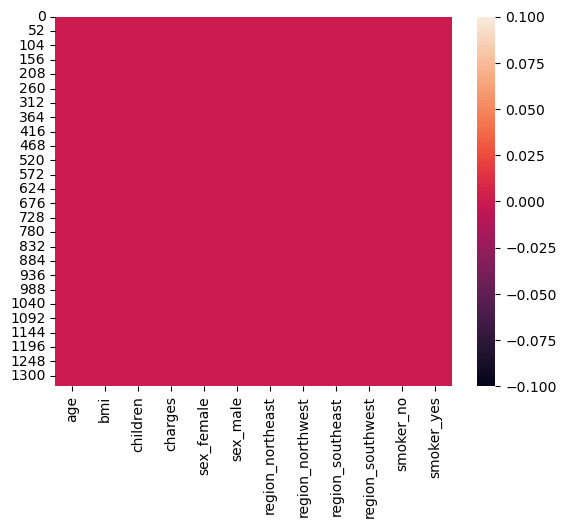

In [57]:
sns.heatmap(medicalinsurancedata_encoded.isnull())

Number of unique values in our target column, which we can see that all them are

In [58]:
medicalinsurancedata_encoded['charges'].unique()

array([16884.924 ,  1725.5523,  4449.462 , ...,  1629.8335,  2007.945 ,
       29141.3603])

In [59]:
medicalinsurancedata_encoded['charges'].nunique()

1337

Counts of each value in the columns

In [60]:
for i in medicalinsurancedata_encoded.columns:
    print(medicalinsurancedata_encoded[i].value_counts())
    print("/n")

18    69
19    68
50    29
51    29
47    29
46    29
45    29
20    29
48    29
52    29
22    28
49    28
54    28
53    28
21    28
26    28
24    28
25    28
28    28
27    28
23    28
43    27
29    27
30    27
41    27
42    27
44    27
31    27
40    27
32    26
33    26
56    26
34    26
55    26
57    26
37    25
59    25
58    25
36    25
38    25
35    25
39    25
61    23
60    23
63    23
62    23
64    22
Name: age, dtype: int64
/n
32.300    13
28.310     9
30.495     8
30.875     8
31.350     8
          ..
46.200     1
23.800     1
44.770     1
32.120     1
30.970     1
Name: bmi, Length: 548, dtype: int64
/n
0    574
1    324
2    240
3    157
4     25
5     18
Name: children, dtype: int64
/n
1639.56310     2
16884.92400    1
29330.98315    1
2221.56445     1
19798.05455    1
              ..
7345.08400     1
26109.32905    1
28287.89766    1
1149.39590     1
29141.36030    1
Name: charges, Length: 1337, dtype: int64
/n
0    676
1    662
Name: sex_female, dtype: int64


In [ ]:
Datatypes of all columns

In [17]:
medicalinsurancedata_encoded.dtypes 

age                   int64
bmi                 float64
children              int64
charges             float64
sex_female            uint8
sex_male              uint8
region_northeast      uint8
region_northwest      uint8
region_southeast      uint8
region_southwest      uint8
smoker_no             uint8
smoker_yes            uint8
dtype: object

Let's convert them all into float values since we will be doing regression models for prediction

In [18]:
medicalinsurancedata_encoded['children'] = medicalinsurancedata['children'].astype(float)
medicalinsurancedata_encoded.dtypes

age                   int64
bmi                 float64
children            float64
charges             float64
sex_female            uint8
sex_male              uint8
region_northeast      uint8
region_northwest      uint8
region_southeast      uint8
region_southwest      uint8
smoker_no             uint8
smoker_yes            uint8
dtype: object

In [19]:
medicalinsurancedata_encoded['region_northeast'] = medicalinsurancedata_encoded['region_northeast'].astype(float)
medicalinsurancedata_encoded.dtypes

age                   int64
bmi                 float64
children            float64
charges             float64
sex_female            uint8
sex_male              uint8
region_northeast    float64
region_northwest      uint8
region_southeast      uint8
region_southwest      uint8
smoker_no             uint8
smoker_yes            uint8
dtype: object

In [20]:
medicalinsurancedata_encoded['region_northwest'] = medicalinsurancedata_encoded['region_northwest'].astype(float)
medicalinsurancedata_encoded['region_southeast'] = medicalinsurancedata_encoded['region_southeast'].astype(float)
medicalinsurancedata_encoded['region_southwest'] = medicalinsurancedata_encoded['region_southwest'].astype(float)
medicalinsurancedata_encoded['sex_female'] = medicalinsurancedata_encoded['sex_female'].astype(float)
medicalinsurancedata_encoded['sex_male'] = medicalinsurancedata_encoded['sex_male'].astype(float)
medicalinsurancedata_encoded['smoker_no'] = medicalinsurancedata_encoded['smoker_no'].astype(float)
medicalinsurancedata_encoded['smoker_yes'] = medicalinsurancedata_encoded['smoker_yes'].astype(float)
medicalinsurancedata_encoded['age'] = medicalinsurancedata_encoded['age'].astype(float)

In [21]:
medicalinsurancedata_encoded.dtypes

age                 float64
bmi                 float64
children            float64
charges             float64
sex_female          float64
sex_male            float64
region_northeast    float64
region_northwest    float64
region_southeast    float64
region_southwest    float64
smoker_no           float64
smoker_yes          float64
dtype: object

Segmenting all the columns in the dataset

In [22]:
medicalcostsfloats_col=[]
for i in medicalinsurancedata_encoded.dtypes.index:
    if medicalinsurancedata_encoded.dtypes[i] == 'float64':
        medicalcostsfloats_col.append(i)
print("medicalcostsfloats columns:", medicalcostsfloats_col)
print("/n")

medicalcostsfloats columns: ['age', 'bmi', 'children', 'charges', 'sex_female', 'sex_male', 'region_northeast', 'region_northwest', 'region_southeast', 'region_southwest', 'smoker_no', 'smoker_yes']
/n


Checking for null values

In [23]:
medicalinsurancedata_encoded.loc[medicalinsurancedata["charges"]==""]

,age,bmi,children,charges,sex_female,sex_male,region_northeast,region_northwest,region_southeast,region_southwest,smoker_no,smoker_yes


Once again checking for null values in each column after encoding them

In [24]:
medicalinsurancedata_encoded.isnull().sum()

age                 0
bmi                 0
children            0
charges             0
sex_female          0
sex_male            0
region_northeast    0
region_northwest    0
region_southeast    0
region_southwest    0
smoker_no           0
smoker_yes          0
dtype: int64

Checking for all unique values in each of the columns to check the distribution of it 

In [158]:
medicalinsurancedata_encoded.nunique().to_frame("No. of Unique values")

,No. of Unique values
age,47
bmi,548
children,6
charges,1337
sex_female,2
sex_male,2
region_northeast,2
region_northwest,2
region_southeast,2
region_southwest,2


Max insurance costs and min insurance costs

In [159]:
print("max costs:",medicalinsurancedata_encoded["charges"].max())
print("min costs:",medicalinsurancedata_encoded["charges"].min())

max costs: 63770.42801
min costs: 1121.8739


Check for duplicated rows

In [25]:
print("Total duplicated rows:", medicalinsurancedata_encoded.duplicated().sum())

Total duplicated rows: 1


Loooking at the duplicated row

In [26]:
duplicates = medicalinsurancedata_encoded[medicalinsurancedata_encoded.duplicated()]
print(duplicates)

      age    bmi  children    charges  sex_female  sex_male  region_northeast  \
581  19.0  30.59       0.0  1639.5631         0.0       1.0               0.0   

     region_northwest  region_southeast  region_southwest  smoker_no  \
581               1.0               0.0               0.0        1.0   

     smoker_yes  
581         0.0  


Removing the duplicated row

In [27]:
unique_duplicates = duplicates.drop_duplicates()

In [28]:
print(unique_duplicates)

      age    bmi  children    charges  sex_female  sex_male  region_northeast  \
581  19.0  30.59       0.0  1639.5631         0.0       1.0               0.0   

     region_northwest  region_southeast  region_southwest  smoker_no  \
581               1.0               0.0               0.0        1.0   

     smoker_yes  
581         0.0  


In [29]:
medicalinsurancedata_encoded=medicalinsurancedata_encoded.drop_duplicates()

In [30]:
print("Total duplicated rows:", medicalinsurancedata_encoded.duplicated().sum())

Total duplicated rows: 0


Now we have no duplicated rows, let's check the new shape

In [31]:
medicalinsurancedata_encoded.shape

(1337, 12)

Let's begin the visualisation problems

1639.56310     2
16884.92400    1
29330.98315    1
2221.56445     1
19798.05455    1
              ..
7345.08400     1
26109.32905    1
28287.89766    1
1149.39590     1
29141.36030    1
Name: charges, Length: 1337, dtype: int64


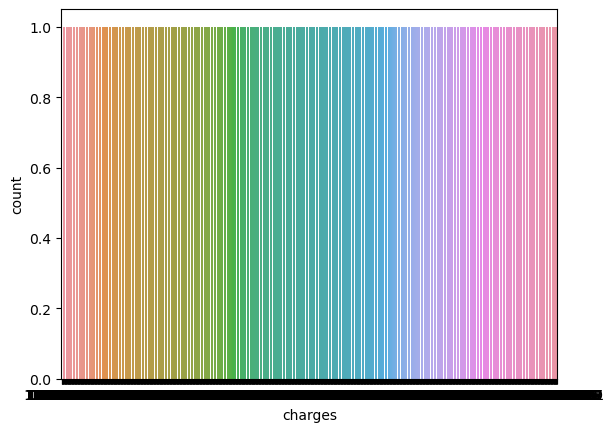

In [167]:
mc=sns.countplot(x='charges',data=medicalinsurancedata_encoded)
print(medicalinsurancedata['charges'].value_counts())

18    69
19    67
50    29
51    29
47    29
46    29
45    29
20    29
48    29
52    29
22    28
49    28
54    28
53    28
21    28
26    28
24    28
25    28
28    28
27    28
23    28
43    27
29    27
30    27
41    27
42    27
44    27
31    27
40    27
32    26
33    26
56    26
34    26
55    26
57    26
37    25
59    25
58    25
36    25
38    25
35    25
39    25
61    23
60    23
63    23
62    23
64    22
Name: age, dtype: int64


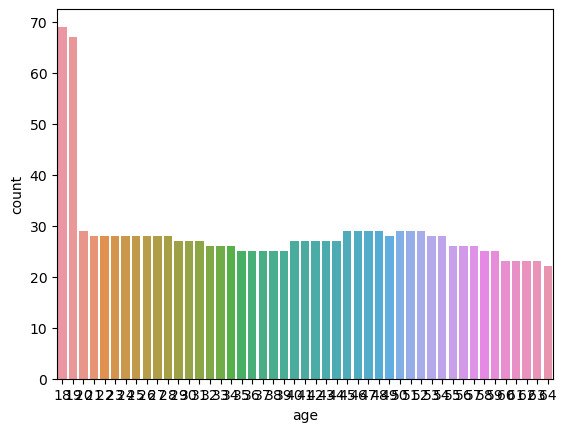

In [80]:
print(medicalinsurancedata_encoded['age'].value_counts())
wc=sns.countplot(x='age',data=medicalinsurancedata_encoded)
plt.show()

0.0    675
1.0    662
Name: sex_female, dtype: int64


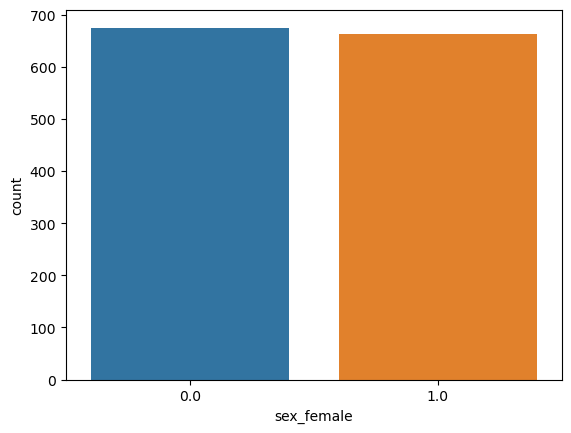

In [168]:
print(medicalinsurancedata_encoded['sex_female'].value_counts())
wc=sns.countplot(x='sex_female',data=medicalinsurancedata_encoded)
plt.show()

1.0    675
0.0    662
Name: sex_male, dtype: int64


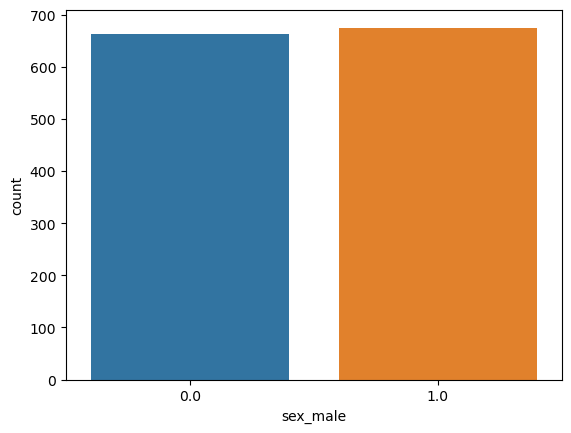

In [169]:
print(medicalinsurancedata_encoded['sex_male'].value_counts())
wc=sns.countplot(x='sex_male',data=medicalinsurancedata_encoded)
plt.show()

32.30    13
28.31     9
30.80     8
31.35     8
28.88     8
         ..
46.20     1
23.80     1
44.77     1
32.12     1
30.97     1
Name: bmi, Length: 548, dtype: int64


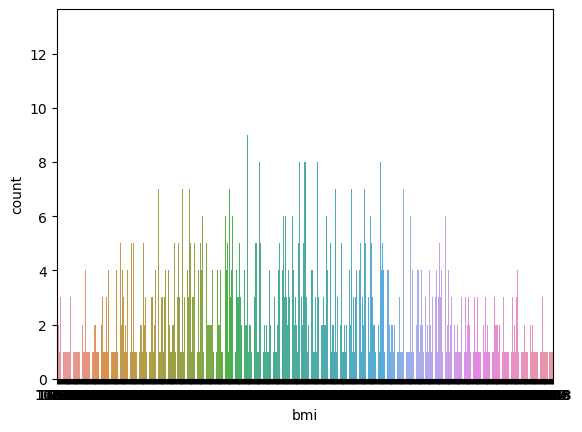

In [85]:
print(medicalinsurancedata_encoded['bmi'].value_counts())
wc=sns.countplot(x='bmi',data=medicalinsurancedata_encoded)
plt.show()

1    1063
0     274
Name: smoker_no, dtype: int64


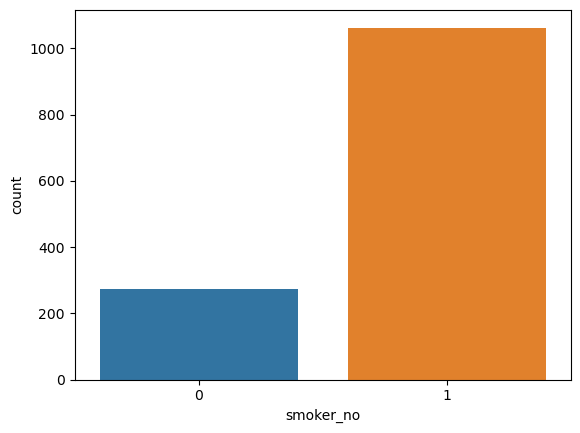

In [86]:
print(medicalinsurancedata_encoded['smoker_no'].value_counts())
wc=sns.countplot(x='smoker_no',data=medicalinsurancedata_encoded)
plt.show()

0    1063
1     274
Name: smoker_yes, dtype: int64


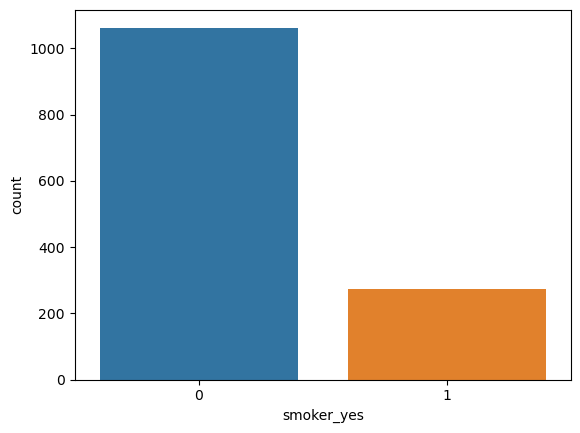

In [87]:
print(medicalinsurancedata_encoded['smoker_yes'].value_counts())
wc=sns.countplot(x='smoker_yes',data=medicalinsurancedata_encoded)
plt.show()

0    1013
1     324
Name: region_northwest, dtype: int64


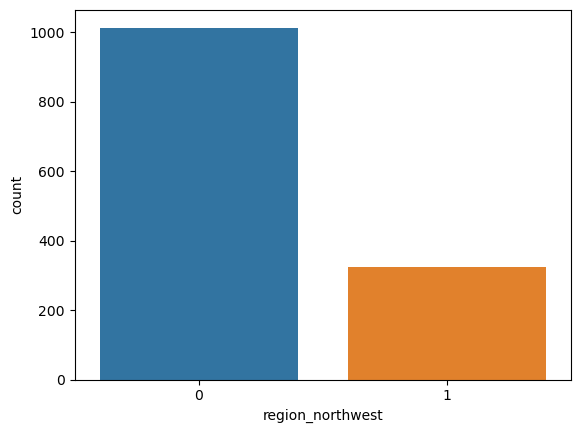

In [88]:
print(medicalinsurancedata_encoded['region_northwest'].value_counts())
wc=sns.countplot(x='region_northwest',data=medicalinsurancedata_encoded)
plt.show()

0    1013
1     324
Name: region_northeast, dtype: int64


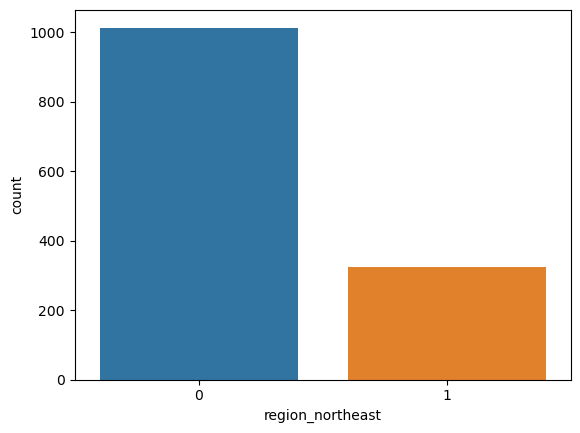

In [89]:
print(medicalinsurancedata_encoded['region_northeast'].value_counts())
wc=sns.countplot(x='region_northeast',data=medicalinsurancedata_encoded)
plt.show()

0    973
1    364
Name: region_southeast, dtype: int64


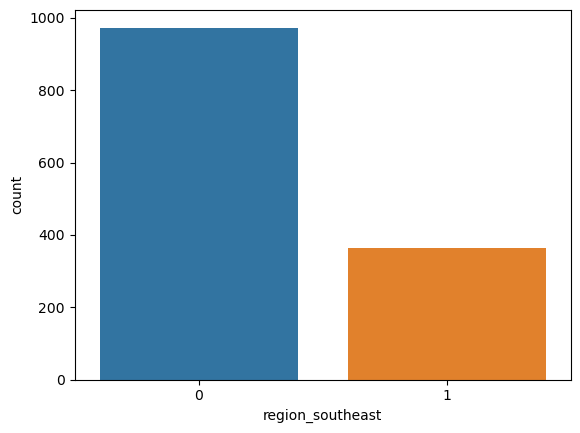

In [90]:
print(medicalinsurancedata_encoded['region_southeast'].value_counts())
wc=sns.countplot(x='region_southeast',data=medicalinsurancedata_encoded)
plt.show()

0    1012
1     325
Name: region_southwest, dtype: int64


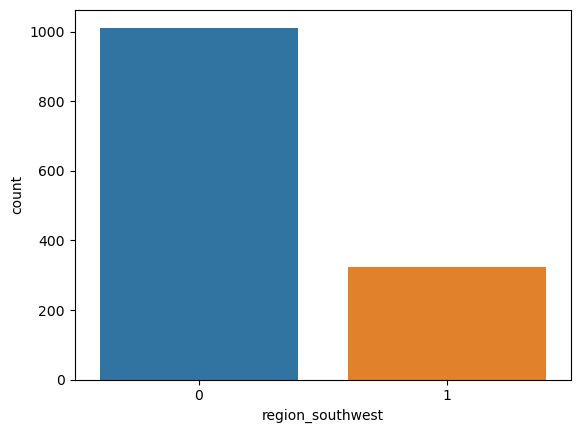

In [91]:
print(medicalinsurancedata_encoded['region_southwest'].value_counts())
wc=sns.countplot(x='region_southwest',data=medicalinsurancedata_encoded)
plt.show()

0.0    1012
1.0     325
Name: region_southwest, dtype: int64


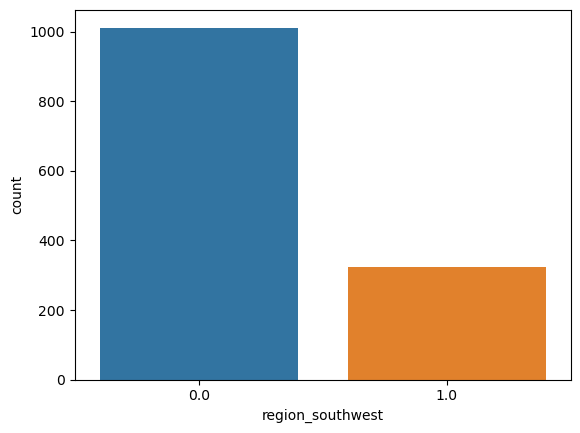

In [170]:
print(medicalinsurancedata_encoded['region_southwest'].value_counts())
wc=sns.countplot(x='region_southwest',data=medicalinsurancedata_encoded)
plt.show()

0.0    573
1.0    324
2.0    240
3.0    157
4.0     25
5.0     18
Name: children, dtype: int64


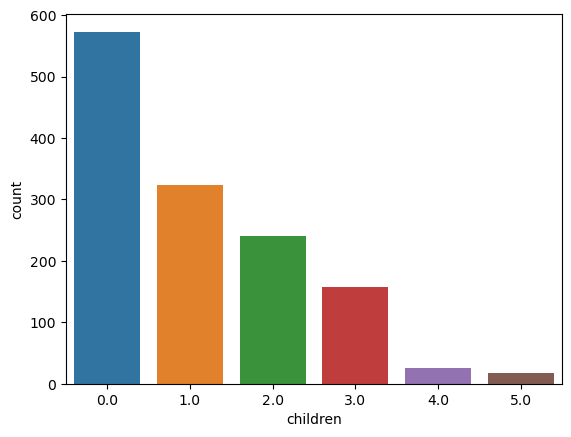

In [171]:
print(medicalinsurancedata_encoded['children'].value_counts())
wc=sns.countplot(x='children',data=medicalinsurancedata_encoded)
plt.show()

Most of the insurance takers have no children

In [172]:
medicalinsurancedata_encoded

,age,bmi,children,charges,sex_female,sex_male,region_northeast,region_northwest,region_southeast,region_southwest,smoker_no,smoker_yes
0,19.0,27.900,0.0,16884.92400,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
1,18.0,33.770,1.0,1725.55230,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
2,28.0,33.000,3.0,4449.46200,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
3,33.0,22.705,0.0,21984.47061,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
4,32.0,28.880,0.0,3866.85520,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1333,50.0,30.970,3.0,10600.54830,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
1334,18.0,31.920,0.0,2205.98080,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1335,18.0,36.850,0.0,1629.83350,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1336,21.0,25.800,0.0,2007.94500,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0


Let's check the mean value of our target column

In [173]:
print(medicalinsurancedata_encoded["charges"].mean())

13279.121486655948


Let's check for absolute values of our dataset

In [174]:
absolute_df = medicalinsurancedata_encoded.abs()
print(absolute_df)

       age     bmi  children      charges  sex_female  sex_male  \
0     19.0  27.900       0.0  16884.92400         1.0       0.0   
1     18.0  33.770       1.0   1725.55230         0.0       1.0   
2     28.0  33.000       3.0   4449.46200         0.0       1.0   
3     33.0  22.705       0.0  21984.47061         0.0       1.0   
4     32.0  28.880       0.0   3866.85520         0.0       1.0   
...    ...     ...       ...          ...         ...       ...   
1333  50.0  30.970       3.0  10600.54830         0.0       1.0   
1334  18.0  31.920       0.0   2205.98080         1.0       0.0   
1335  18.0  36.850       0.0   1629.83350         1.0       0.0   
1336  21.0  25.800       0.0   2007.94500         1.0       0.0   
1337  61.0  29.070       0.0  29141.36030         1.0       0.0   

      region_northeast  region_northwest  region_southeast  region_southwest  \
0                  0.0               0.0               0.0               1.0   
1                  0.0             

Let's get the distribution plots of our dataset

C:\Users\ACHU NARAYAN\AppData\Local\Temp\ipykernel_24524\3245925216.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(medicalinsurancedata_encoded[col],color="m")
C:\Users\ACHU NARAYAN\AppData\Local\Temp\ipykernel_24524\3245925216.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(medicalinsu

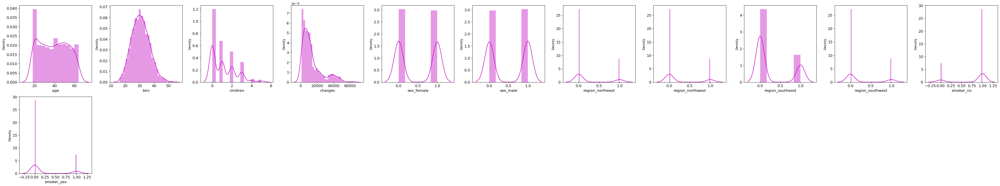

In [178]:
plt.figure(figsize=(45,45),facecolor = "white")
plotnumber=1
for col in medicalcostsfloats_col:
    if plotnumber<=12:
        wc=plt.subplot(11,11,plotnumber)
        sns.distplot(medicalinsurancedata_encoded[col],color="m")
        plt.xlabel(col,fontsize = 12)
        plt.xticks(rotation=0, fontsize=12)
        plt.yticks(rotation=0, fontsize = 12)
    plotnumber+=1
plt.tight_layout()

We can see that our target column, children column is skewed, whereas most of the other columns have somewhat normal distribution

Let's move on with stripplots

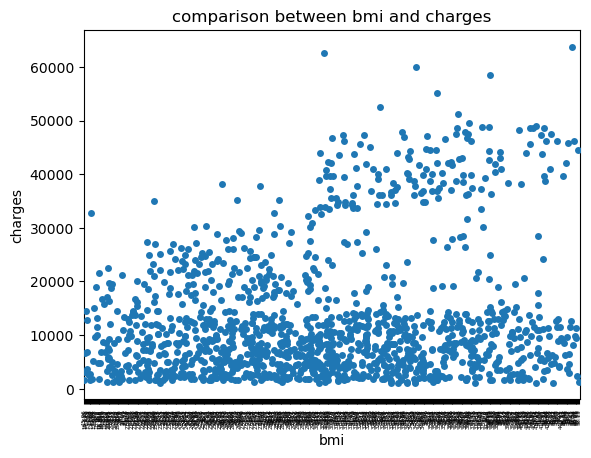

<Figure size 2800x200 with 0 Axes>

In [179]:
plt.title("comparison between bmi and charges")
sns.stripplot(x= "bmi", y= "charges", data =medicalinsurancedata_encoded)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

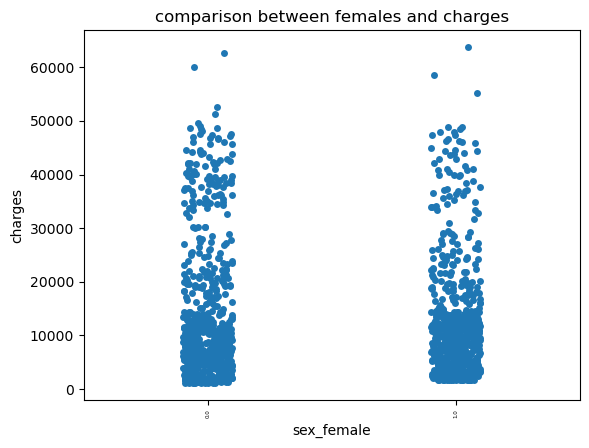

<Figure size 2800x200 with 0 Axes>

In [180]:
plt.title("comparison between females and charges")
sns.stripplot(x= "sex_female", y= "charges", data = medicalinsurancedata_encoded)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

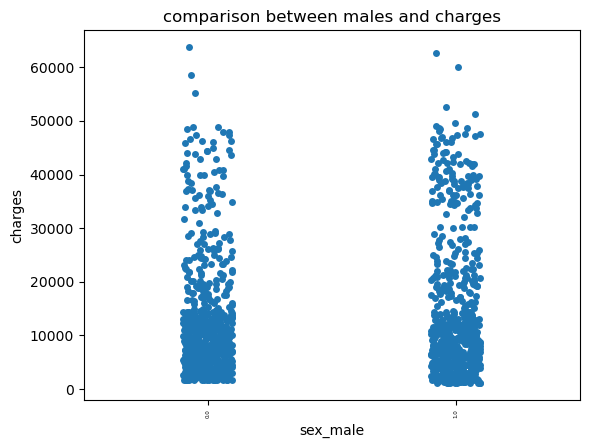

<Figure size 2800x200 with 0 Axes>

In [181]:
plt.title("comparison between males and charges")
sns.stripplot(x= "sex_male", y= "charges", data = medicalinsurancedata_encoded)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

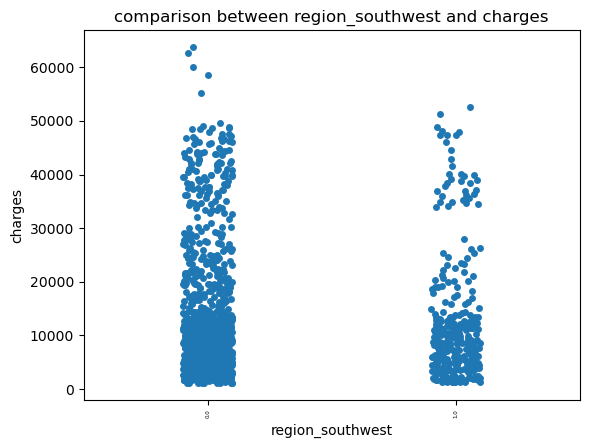

<Figure size 2800x200 with 0 Axes>

In [182]:
plt.title("comparison between region_southwest and charges")
sns.stripplot(x= "region_southwest", y= "charges", data = medicalinsurancedata_encoded)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

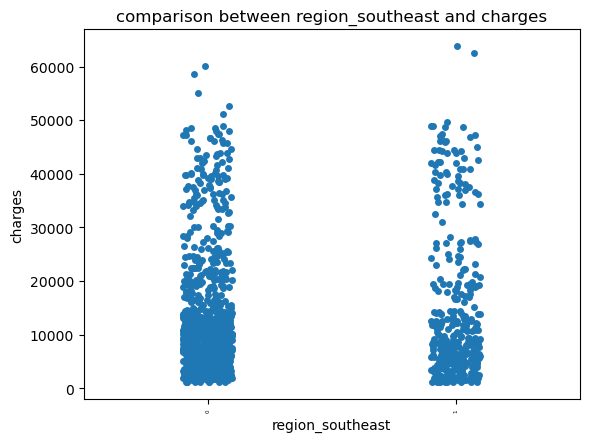

<Figure size 2800x200 with 0 Axes>

In [107]:
plt.title("comparison between region_southeast and charges")
sns.stripplot(x= "region_southeast", y= "charges", data = medicalinsurancedata_encoded)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

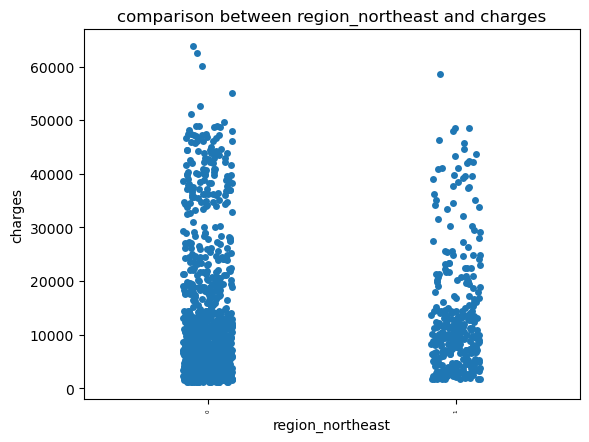

<Figure size 2800x200 with 0 Axes>

In [108]:
plt.title("comparison between region_northeast and charges")
sns.stripplot(x= "region_northeast", y= "charges", data = medicalinsurancedata_encoded)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

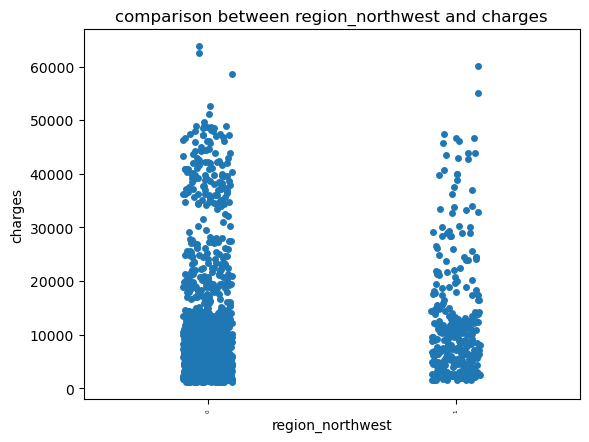

<Figure size 2800x200 with 0 Axes>

In [109]:
plt.title("comparison between region_northwest and charges")
sns.stripplot(x= "region_northwest", y= "charges", data = medicalinsurancedata_encoded)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

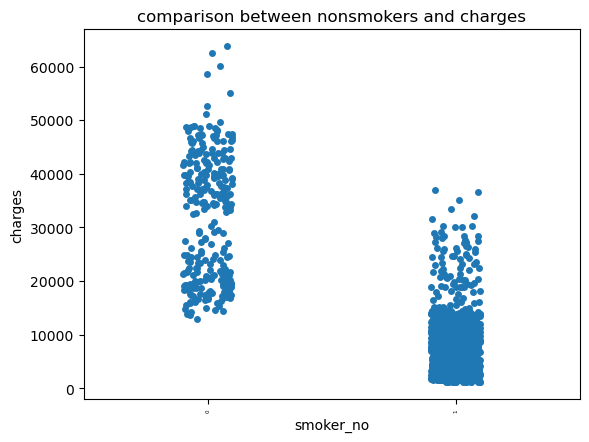

<Figure size 2800x200 with 0 Axes>

In [113]:
plt.title("comparison between nonsmokers and charges")
sns.stripplot(x= "smoker_no", y= "charges", data = medicalinsurancedata_encoded)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

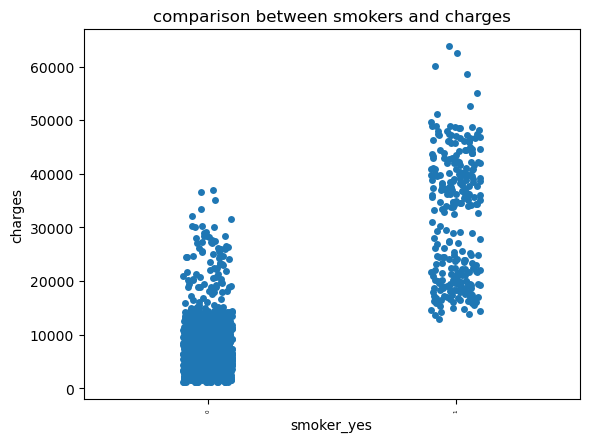

<Figure size 2800x200 with 0 Axes>

In [112]:
plt.title("comparison between smokers and charges")
sns.stripplot(x= "smoker_yes", y= "charges", data = medicalinsurancedata_encoded)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

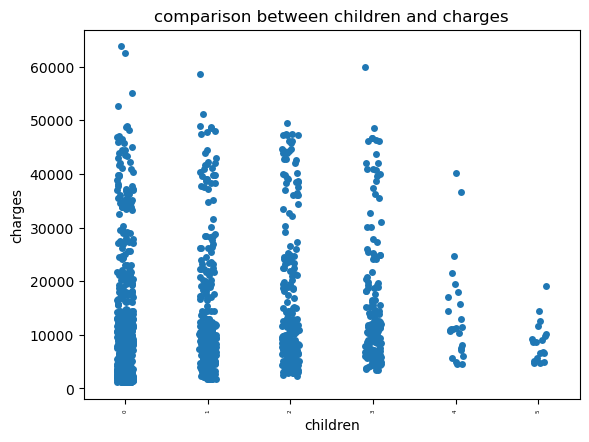

<Figure size 2800x200 with 0 Axes>

In [114]:
plt.title("comparison between children and charges")
sns.stripplot(x= "children", y= "charges", data = medicalinsurancedata_encoded)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

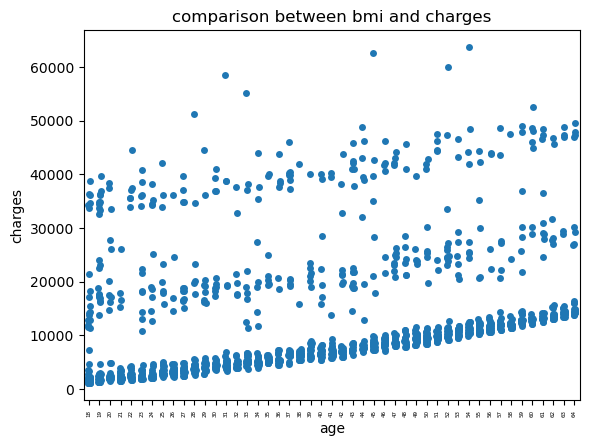

<Figure size 2800x200 with 0 Axes>

In [115]:
plt.title("comparison between bmi and charges")
sns.stripplot(x= "age", y= "charges", data = medicalinsurancedata_encoded)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

BMI and children look like have correlation with chrages

let's look at scatter plots

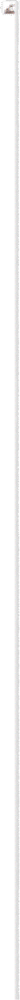

In [183]:
plt.title("comparison between bmi and charges")
sns.scatterplot(x= 'bmi', y= 'charges', data = medicalinsurancedata_encoded,hue='charges', palette='dark')
plt.show()

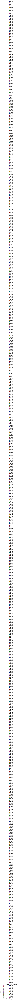

In [91]:
plt.title("comparison between bmi and charges")
sns.scatterplot(x= 'sex', y= 'charges', data = medicalinsurancedata,hue='charges', palette='dark')
plt.show()

As wer can see, we can't make much from these plots, lets try bar plots and see if we can make something of it

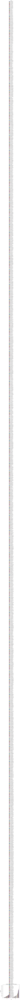

In [95]:
plt.title("comparison between sex and charges")
sns.barplot(x= "sex", y= "charges", data = medicalinsurancedata, hue='charges', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

We can see equal distribution between males and females who take insurance costs

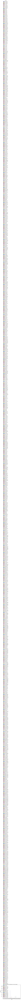

In [96]:
plt.title("comparison between age and charges")
sns.barplot(x= "age", y= "charges", data = medicalinsurancedata, hue='charges', palette='dark')
plt.xticks(rotation=90, fontsize=10)
plt.show()

From the plot we can see that age 36 stands out with highest number of charges

Let's get a clearer picture with regression plot

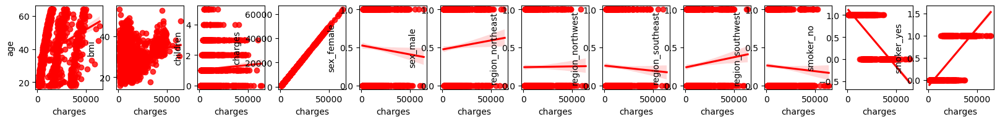

In [123]:
plt.figure(figsize=(20,25))
p=1
for i in medicalinsurancedata_encoded:
    if p<=13:
        plt.subplot(12,12,p)
        sns.regplot(x="charges",y=i,data=medicalinsurancedata_encoded,color='r')
        plt.xlabel("charges")
        plt.ylabel(i)
    p+=1
plt.show()

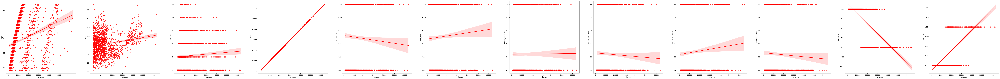

In [124]:
plt.figure(figsize=(120,125))
p=1
for i in medicalinsurancedata_encoded:
    if p<=13:
        plt.subplot(12,12,p)
        sns.regplot(x="charges",y=i,data=medicalinsurancedata_encoded,color='r')
        plt.xlabel("charges")
        plt.ylabel(i)
    p+=1
plt.show()

charges and bmi are correlated- mostly are concentrated in 25 to 35 range
charges and age are correlated- younger take lower insurance costs than older clients
children and charges are correlated- people with no children take more insurance costs than people with 5 children
sex_male take insurance costs with higher charges and sex_female take insurance costs with lower charges
non smokers take lower insurance costs than smokers
regions have no effect on charges

Now let's do linear regression visualisations on the dataset

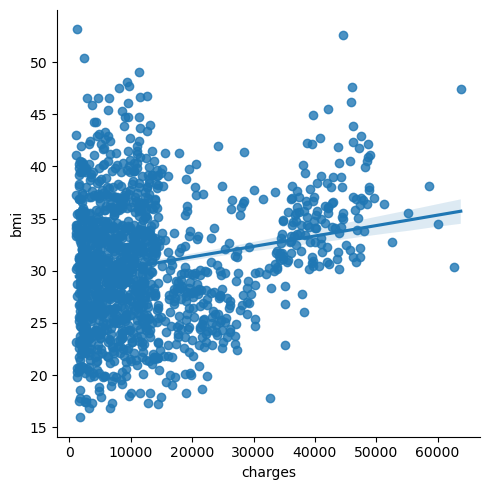

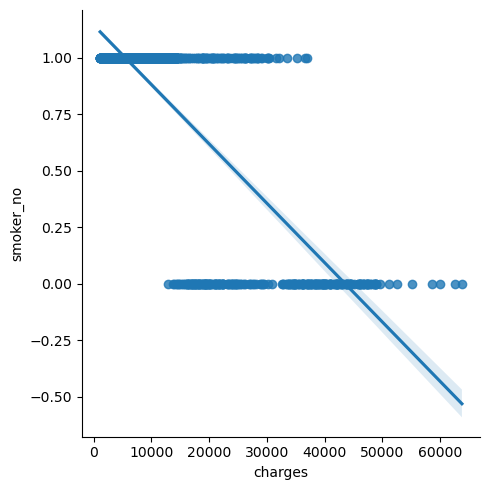

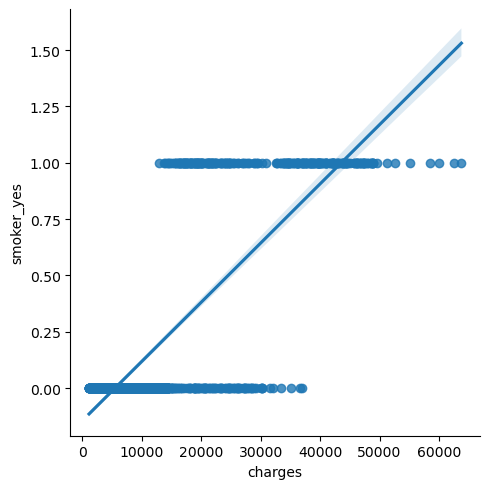

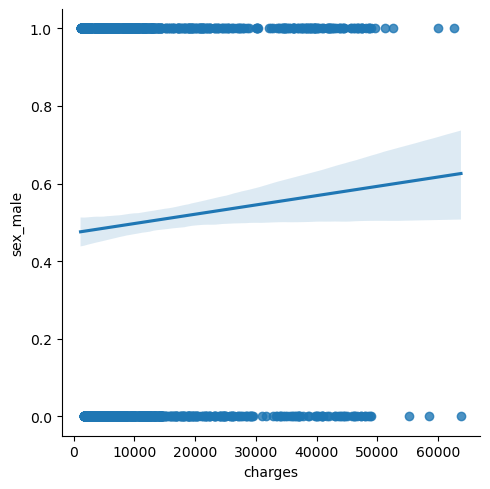

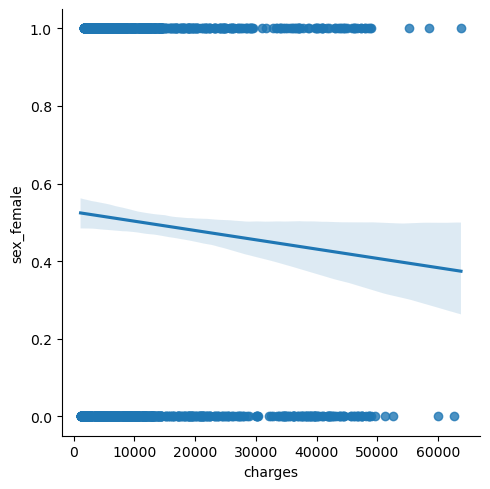

...

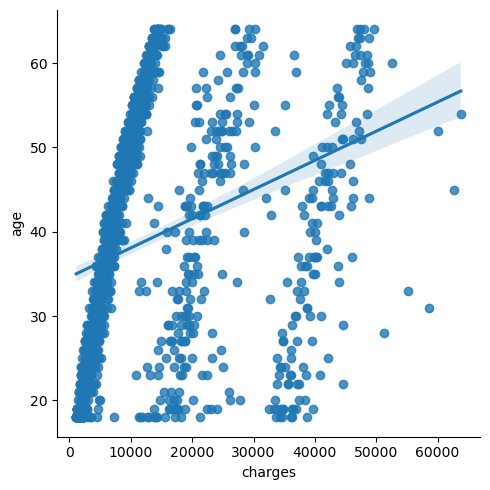

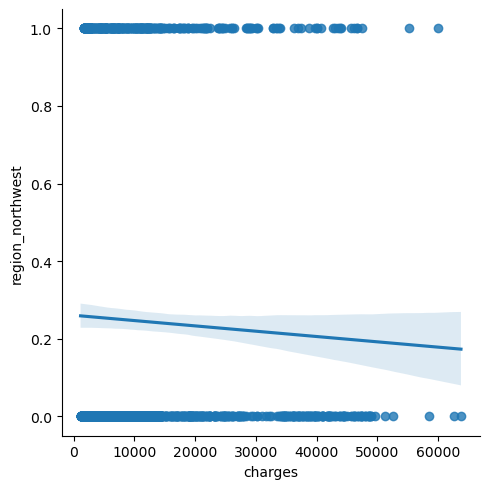

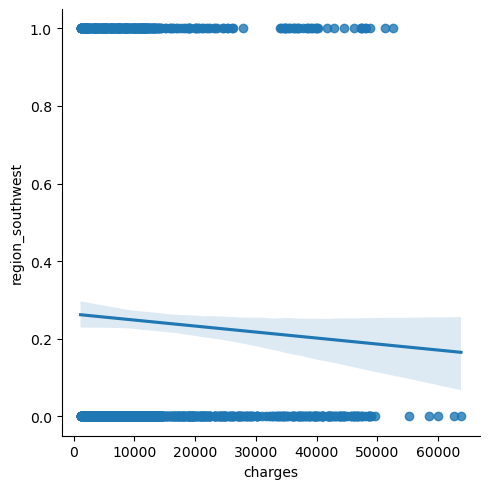

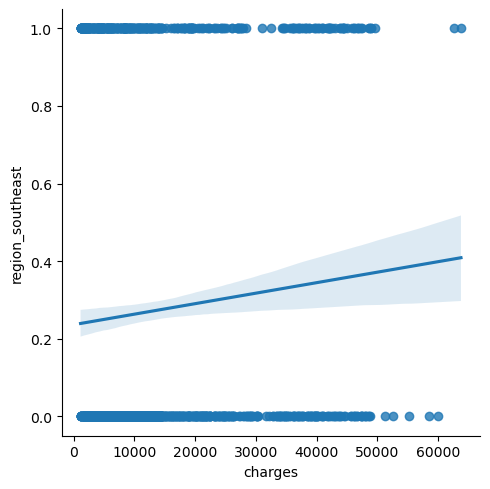

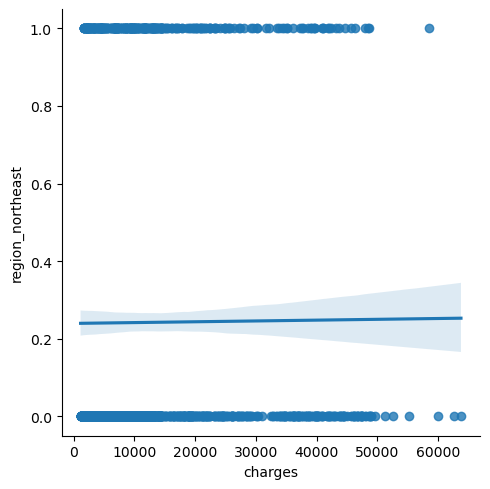

In [125]:
sns.lmplot(x='charges', y= 'bmi', data=medicalinsurancedata_encoded,palette='colorblind')
sns.lmplot(x='charges', y= 'smoker_no', data=medicalinsurancedata_encoded,palette='colorblind')
sns.lmplot(x='charges', y= 'smoker_yes', data=medicalinsurancedata_encoded,palette='colorblind')
sns.lmplot(x='charges', y= 'sex_male', data=medicalinsurancedata_encoded,palette='colorblind')
sns.lmplot(x='charges', y= 'sex_female', data=medicalinsurancedata_encoded,palette='colorblind')
sns.lmplot(x='charges', y= 'children', data=medicalinsurancedata_encoded,palette='colorblind')
sns.lmplot(x='charges', y= 'age', data=medicalinsurancedata_encoded,palette='colorblind')
sns.lmplot(x='charges', y= 'region_northwest', data=medicalinsurancedata_encoded,palette='colorblind')
sns.lmplot(x='charges', y= 'region_southwest', data=medicalinsurancedata_encoded,palette='colorblind')
sns.lmplot(x='charges', y= 'region_southeast', data=medicalinsurancedata_encoded,palette='colorblind')
sns.lmplot(x='charges', y= 'region_northeast', data=medicalinsurancedata_encoded,palette='colorblind')

We see the same results as we saw earlier

Now lets do multivariate analysis

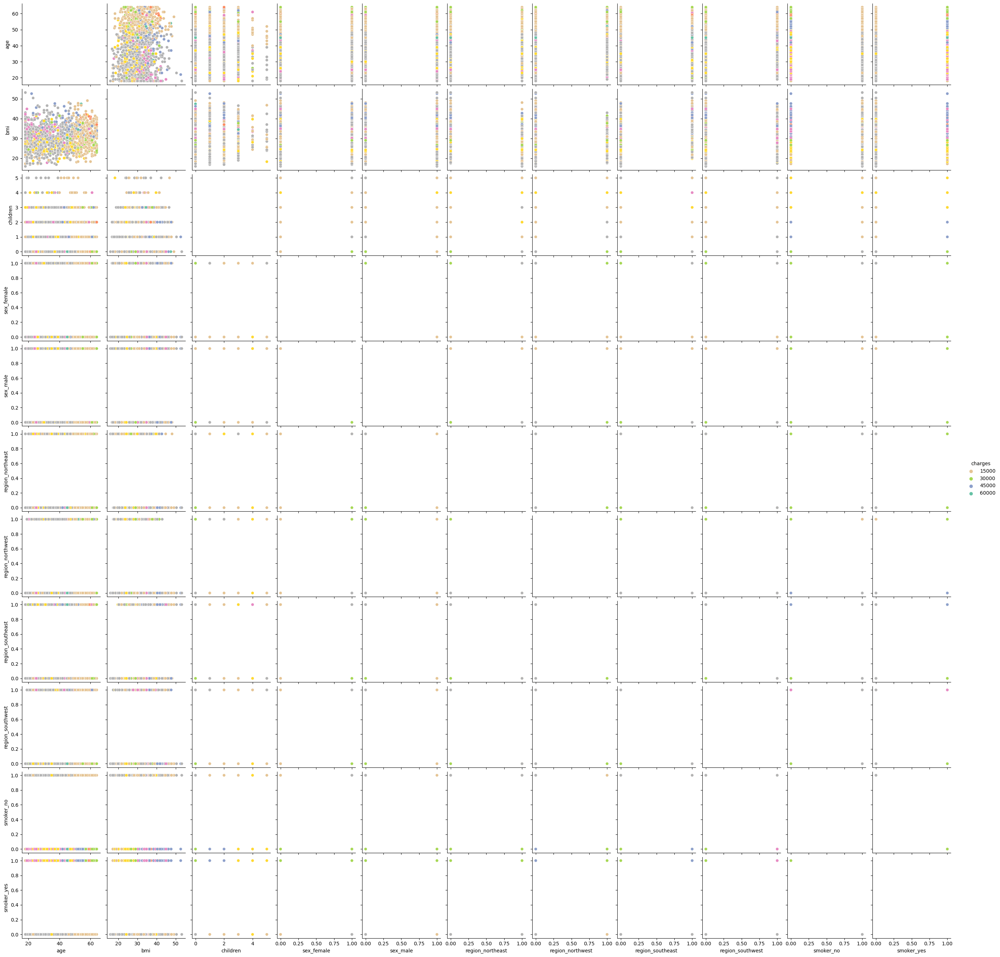

In [185]:
sns.pairplot(medicalinsurancedata_encoded,hue='charges',palette="Set2_r")
plt.show()

Not many values are correlated other than bmi and age

Let's check for outliers using boxplots

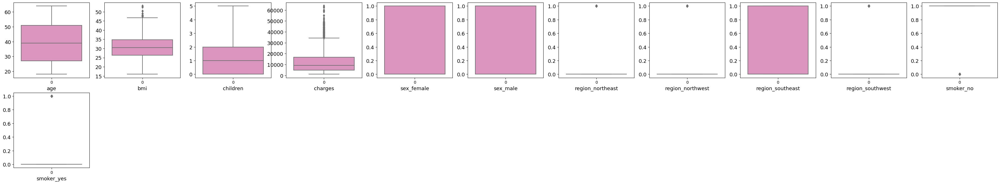

In [188]:
plt.figure(figsize=(45,45),facecolor = "white")
plotnumber=1
for col in medicalcostsfloats_col:
    if plotnumber<=12:
        wc=plt.subplot(11,11,plotnumber)
        sns.boxplot(medicalinsurancedata_encoded[col],palette="Set2_r")
        plt.xlabel(col,rotation=0,fontsize = 13)
        plt.yticks(rotation = 0, fontsize = 13)
    plotnumber+=1
plt.show()

Outliers are present which we need to remove later using the z-score method

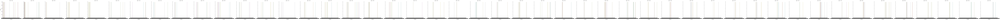

<Figure size 12800x12800 with 0 Axes>

In [189]:
sns.catplot(x= 'charges', col= 'age', data = medicalinsurancedata_encoded, kind="count", palette='Dark2')
plt.figure(figsize=(128, 128))
plt.show()

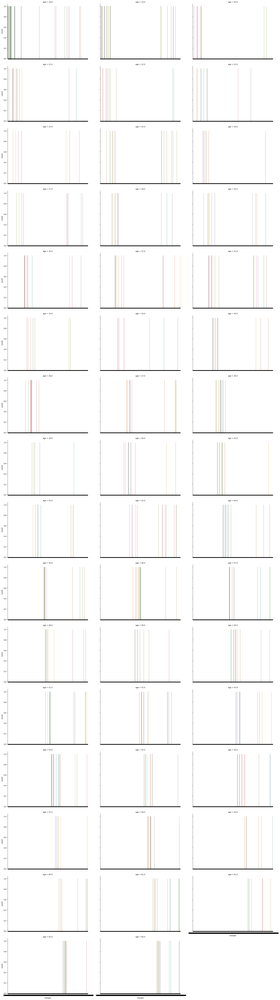

In [195]:
sns.catplot(x='charges', col='age', data=medicalinsurancedata_encoded, kind="count", palette='Dark2', height=5, aspect=1.5, col_wrap=3)

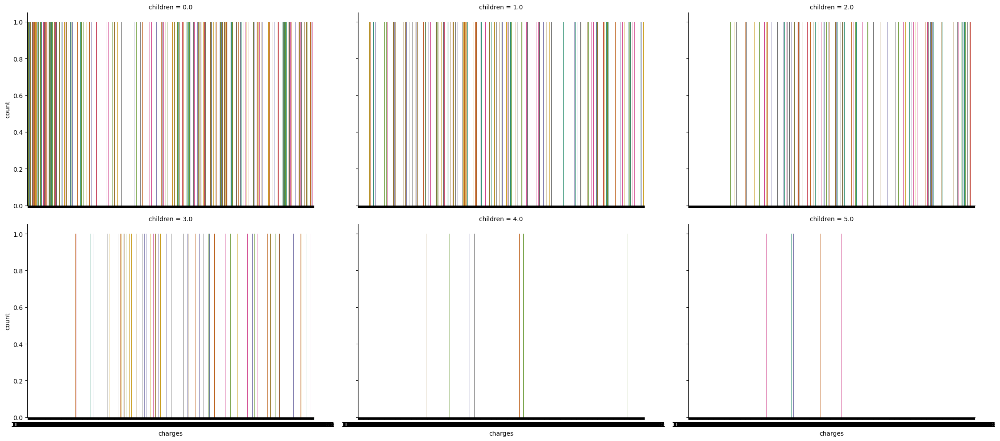

In [198]:
sns.catplot(x='charges', col='children', data=medicalinsurancedata_encoded, kind="count", palette='Dark2', height=5, aspect=1.5, col_wrap=3)

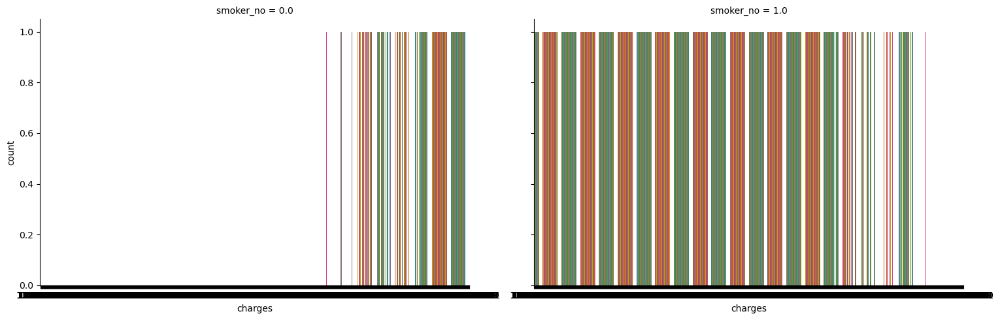

In [199]:
sns.catplot(x='charges', col='smoker_no', data=medicalinsurancedata_encoded, kind="count", palette='Dark2', height=5, aspect=1.5, col_wrap=3)

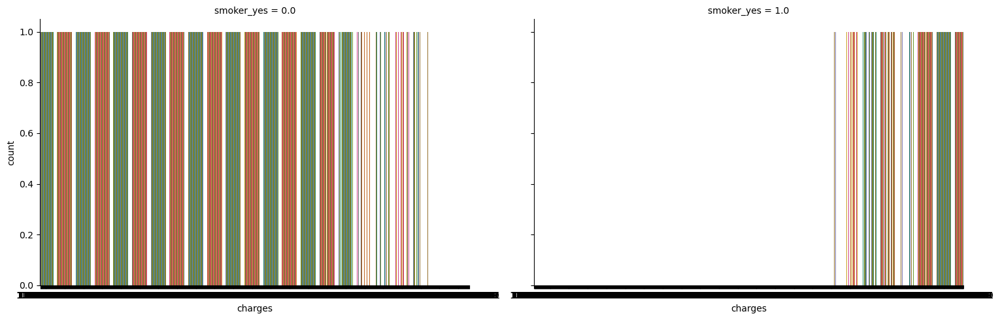

In [200]:
sns.catplot(x='charges', col='smoker_yes', data=medicalinsurancedata_encoded, kind="count", palette='Dark2', height=5, aspect=1.5, col_wrap=3)

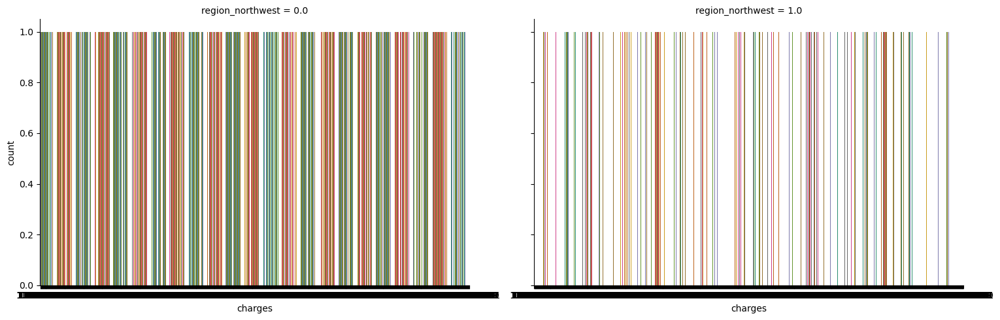

In [201]:
sns.catplot(x='charges', col='region_northwest', data=medicalinsurancedata_encoded, kind="count", palette='Dark2', height=5, aspect=1.5, col_wrap=3)

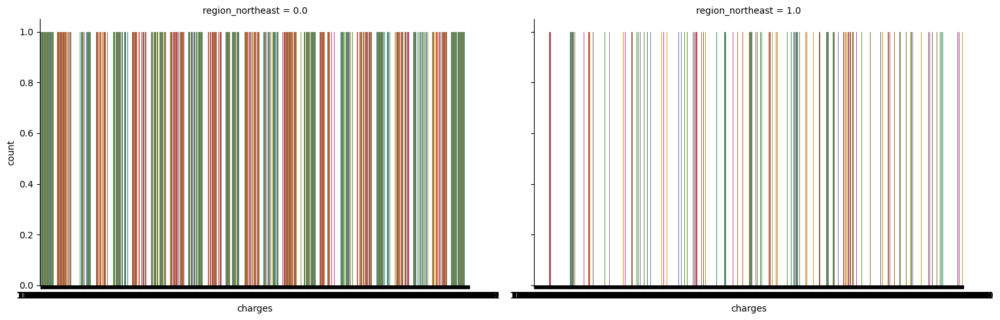

In [202]:
sns.catplot(x='charges', col='region_northeast', data=medicalinsurancedata_encoded, kind="count", palette='Dark2', height=5, aspect=1.5, col_wrap=3)

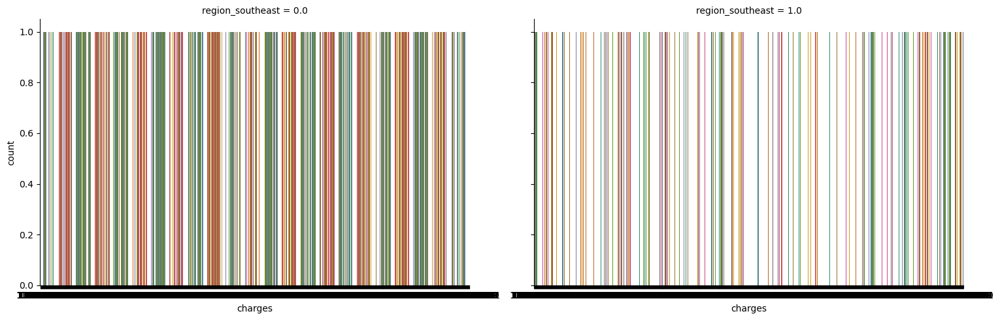

In [203]:
sns.catplot(x='charges', col='region_southeast', data=medicalinsurancedata_encoded, kind="count", palette='Dark2', height=5, aspect=1.5, col_wrap=3)

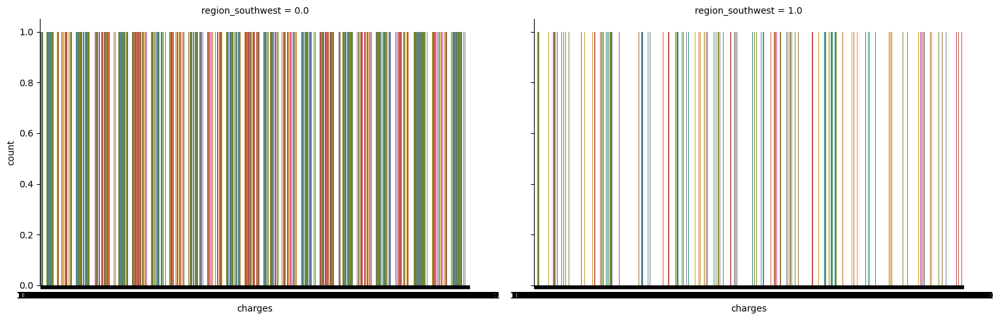

In [204]:
sns.catplot(x='charges', col='region_southwest', data=medicalinsurancedata_encoded, kind="count", palette='Dark2', height=5, aspect=1.5, col_wrap=3)

In [ ]:
sns.catplot(x='charges', col='bmi', data=medicalinsurancedata_encoded, kind="count", palette='Dark2', height=2, aspect=1.5, col_wrap=3)

These plots further validatesd our previous discoveries

Let's check for skewness in each column and remove them using cube root and square root formulaes

In [33]:
medicalinsurancedata_encoded.skew()

age                 0.054781
bmi                 0.283914
children            0.937421
charges             1.515391
sex_female          0.019469
sex_male           -0.019469
region_northeast    1.204009
region_northwest    1.204009
region_southeast    1.024467
region_southwest    1.199258
smoker_no          -1.463601
smoker_yes          1.463601
dtype: float64

In [38]:
medicalinsurancedata_encoded_copy = medicalinsurancedata_encoded.copy()
medicalinsurancedata_encoded_copy['charges'] = medicalinsurancedata_encoded_copy['charges'].apply(lambda x: np.cbrt(x))
medicalinsurancedata_encoded_copy['region_northeast'] = medicalinsurancedata_encoded_copy['region_northeast'].apply(lambda x: np.cbrt(x))
medicalinsurancedata_encoded_copy['region_northwest'] = medicalinsurancedata_encoded_copy['region_northwest'].apply(lambda x: np.cbrt(x))
medicalinsurancedata_encoded_copy['region_southeast'] = medicalinsurancedata_encoded_copy['region_southeast'].apply(lambda x: np.cbrt(x))
medicalinsurancedata_encoded_copy['region_southwest'] = medicalinsurancedata_encoded_copy['region_southwest'].apply(lambda x: np.cbrt(x))
medicalinsurancedata_encoded_copy['smoker_no'] = medicalinsurancedata_encoded_copy['smoker_no'].apply(lambda x: np.cbrt(x))
medicalinsurancedata_encoded_copy['smoker_yes'] = medicalinsurancedata_encoded_copy['smoker_yes'].apply(lambda x: np.cbrt(x))

In [40]:
medicalinsurancedata_encoded.skew()

age                 0.054781
bmi                 0.283914
children            0.937421
charges            -0.082149
sex_female          0.019469
sex_male           -0.019469
region_northeast    1.204009
region_northwest    1.204009
region_southeast    1.024467
region_southwest    1.199258
smoker_no          -1.463601
smoker_yes          1.463601
dtype: float64

In [62]:
medicalinsurancedata_encoded_copy['region_northeast'] = medicalinsurancedata_encoded_copy['region_northeast'].apply(lambda x: np.sqrt(x))
medicalinsurancedata_encoded_copy['region_northwest'] = medicalinsurancedata_encoded_copy['region_northwest'].apply(lambda x: np.sqrt(x))
medicalinsurancedata_encoded_copy['region_southeast'] = medicalinsurancedata_encoded_copy['region_southeast'].apply(lambda x: np.sqrt(x))
medicalinsurancedata_encoded_copy['region_southwest'] = medicalinsurancedata_encoded_copy['region_southwest'].apply(lambda x: np.sqrt(x))
medicalinsurancedata_encoded_copy['smoker_no'] = medicalinsurancedata_encoded_copy['smoker_no'].apply(lambda x: np.sqrt(x))
medicalinsurancedata_encoded_copy['smoker_yes'] = medicalinsurancedata_encoded_copy['smoker_yes'].apply(lambda x: np.sqrt(x))

In [63]:
medicalinsurancedata_encoded_copy.skew()

age                 0.054781
bmi                 0.283914
children            0.937421
charges            -0.082149
sex_female          0.019469
sex_male           -0.019469
region_northeast    1.204009
region_northwest    1.204009
region_southeast    1.024467
region_southwest    1.199258
smoker_no          -1.463601
smoker_yes          1.463601
dtype: float64

Now let's check for distribution of our target column= charges which shows a normal distribution

C:\Users\ACHU NARAYAN\AppData\Local\Temp\ipykernel_21448\1458653377.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(medicalinsurancedata_encoded['charges'],color="b", kde_kws={"shade":True}, hist=False)
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\distributions.py:2511: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


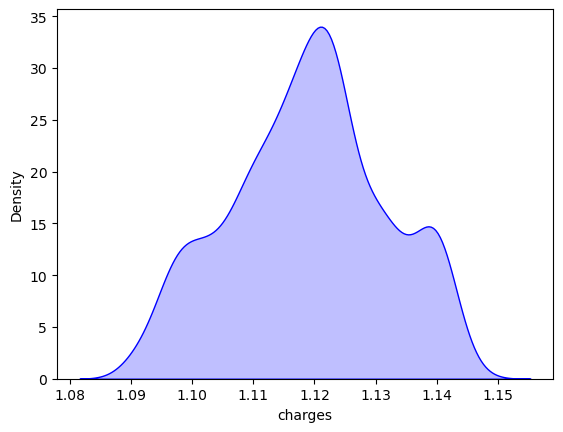

In [42]:
sns.distplot(medicalinsurancedata_encoded['charges'],color="b", kde_kws={"shade":True}, hist=False)
plt.show()

let's start removing the outliers

In [43]:
from scipy.stats import zscore
out_features=medicalinsurancedata_encoded[['age','bmi','children','charges','sex_female','sex_male','region_northeast','region_northwest','region_southeast','region_southwest','smoker_no','smoker_yes']]
z=np.abs(zscore(out_features))
z

,age,bmi,children,charges,sex_female,sex_male,region_northeast,region_northwest,region_southeast,region_southwest,smoker_no,smoker_yes
0,1.440418,0.453160,0.909234,0.687980,1.009771,1.009771,0.565546,0.565546,0.611638,1.764609,1.969660,1.969660
1,1.511647,0.509422,0.079442,1.781358,0.990324,0.990324,0.565546,0.565546,1.634955,0.566698,0.507702,0.507702
2,0.799350,0.383155,1.580143,0.764289,0.990324,0.990324,0.565546,0.565546,1.634955,0.566698,0.507702,0.507702
3,0.443201,1.305052,0.909234,0.978216,0.990324,0.990324,0.565546,1.768203,0.611638,0.566698,0.507702,0.507702
4,0.514431,0.292456,0.909234,0.915729,0.990324,0.990324,0.565546,1.768203,0.611638,0.566698,0.507702,0.507702
...,...,...,...,...,...,...,...,...,...,...,...,...
1333,0.767704,0.050269,1.580143,0.178337,0.990324,0.990324,0.565546,1.768203,0.611638,0.566698,0.507702,0.507702
1334,1.511647,0.206053,0.909234,1.518766,1.009771,1.009771,1.768203,0.565546,0.611638,0.566698,0.507702,0.507702
1335,1.511647,1.014490,0.909234,1.842256,1.009771,1.009771,0.565546,0.565546,1.634955,0.566698,0.507702,0.507702
1336,1.297958,0.797524,0.909234,1.619418,1.009771,1.009771,0.565546,0.565546,0.611638,1.764609,0.507702,0.507702


In [44]:
np.where(z>3)

(array([  32,   71,  116,  166,  413,  425,  438,  568,  639,  846,  876,
         931,  936,  968,  983, 1046, 1084, 1115, 1129, 1244, 1271, 1316],
       dtype=int64),
 array([2, 2, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 1],
       dtype=int64))

In [48]:
z.iloc[32,2]

3.2397285521666808

In [49]:
medicalinsurancedata_encodednew=medicalinsurancedata_encoded[(z<3).all(axis=1)]
medicalinsurancedata_encodednew.shape

(1315, 12)

In [53]:
data_loss_percentage = ((medicalinsurancedata_encoded.shape[0] - medicalinsurancedata_encodednew.shape[0]) / medicalinsurancedata_encoded.shape[0]) * 100
print("Data Loss Percentage:", data_loss_percentage)

Data Loss Percentage: 1.6454749439042633


In [54]:
medicalinsurancedata_encodednew=medicalinsurancedata_encoded

We won't be using the quartile method since the data loss is too much based on that method

In [55]:
Q1=out_features.quantile(0.25)
Q3=out_features.quantile(0.75)
IQR=Q3-Q1
medicalinsurancedata_encodedfresh=medicalinsurancedata_encoded[~((medicalinsurancedata_encoded<(Q1-1.5*IQR)) | (medicalinsurancedata_encoded>(Q3+1.5*IQR))).any(axis=1)]

In [56]:
medicalinsurancedata_encodedfresh.shape

(268, 12)

Let's get all correlations between all variables of our encoded dataset

In [65]:
medicalinsurancedata_encoded.corr()

,age,bmi,children,charges,sex_female,sex_male,region_northeast,region_northwest,region_southeast,region_southwest,smoker_no,smoker_yes
age,1.000000,0.109344,0.041536,0.524361,0.019814,-0.019814,0.001868,0.001495,-0.012311,0.009415,0.025587,-0.025587
bmi,0.109344,1.000000,0.012755,0.133704,-0.046397,0.046397,-0.138178,-0.136138,0.270057,-0.006211,-0.003746,0.003746
children,0.041536,0.012755,1.000000,0.158917,-0.017848,0.017848,-0.023202,0.026044,-0.023492,0.021538,-0.007331,0.007331
charges,0.524361,0.133704,0.158917,1.000000,-0.007872,0.007872,0.041943,-0.015837,0.015883,-0.042561,-0.668623,0.668623
sex_female,0.019814,-0.046397,-0.017848,-0.007872,1.000000,-1.000000,0.002008,0.012482,-0.017578,0.003767,0.076596,-0.076596
sex_male,-0.019814,0.046397,0.017848,0.007872,-1.000000,1.000000,-0.002008,-0.012482,0.017578,-0.003767,-0.076596,0.076596
region_northeast,0.001868,-0.138178,-0.023202,0.041943,0.002008,-0.002008,1.000000,-0.319842,-0.345909,-0.320493,-0.002597,0.002597
region_northwest,0.001495,-0.136138,0.026044,-0.015837,0.012482,-0.012482,-0.319842,1.000000,-0.345909,-0.320493,0.036321,-0.036321
region_southeast,-0.012311,0.270057,-0.023492,0.015883,-0.017578,0.017578,-0.345909,-0.345909,1.000000,-0.346614,-0.068282,0.068282
region_southwest,0.009415,-0.006211,0.021538,-0.042561,0.003767,-0.003767,-0.320493,-0.320493,-0.346614,1.000000,0.037168,-0.037168


From the table we can see that age, smoker_no, smoker_yes, bmi, and children are correlated with the charges column. Let's confirm it with visualisations.

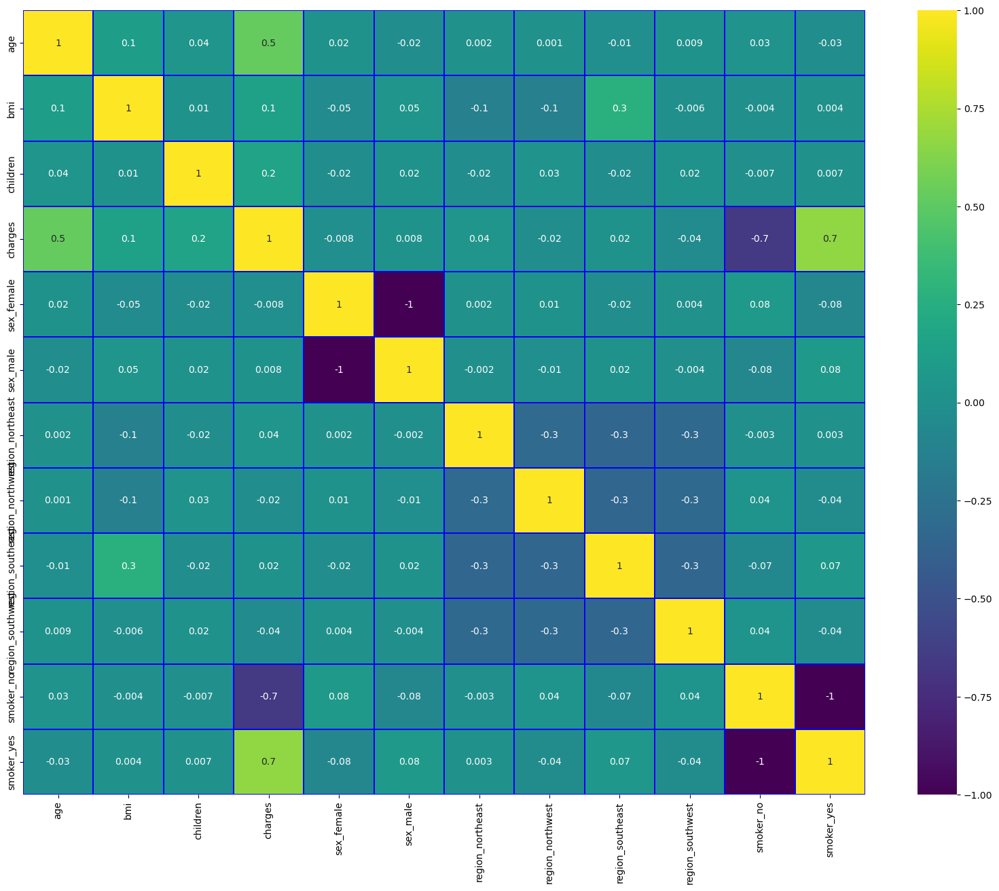

In [66]:
plt.figure(figsize = (20,15))
sns.heatmap(medicalinsurancedata_encoded.corr(), linewidths = 0.1, fmt = ".1g", linecolor= "blue", annot=True, cmap= "viridis")
plt.yticks(rotation=90);
plt.show()

In [ ]:
Now to check all their correlations

In [67]:
medicalinsurancedata_encoded.corr().charges.sort_values()

smoker_no          -0.668623
region_southwest   -0.042561
region_northwest   -0.015837
sex_female         -0.007872
sex_male            0.007872
region_southeast    0.015883
region_northeast    0.041943
bmi                 0.133704
children            0.158917
age                 0.524361
smoker_yes          0.668623
charges             1.000000
Name: charges, dtype: float64

From the table we can see that age, smoker_no, smoker_yes, bmi, and children are correlated with the charges column. Let's confirm it with visualisations.

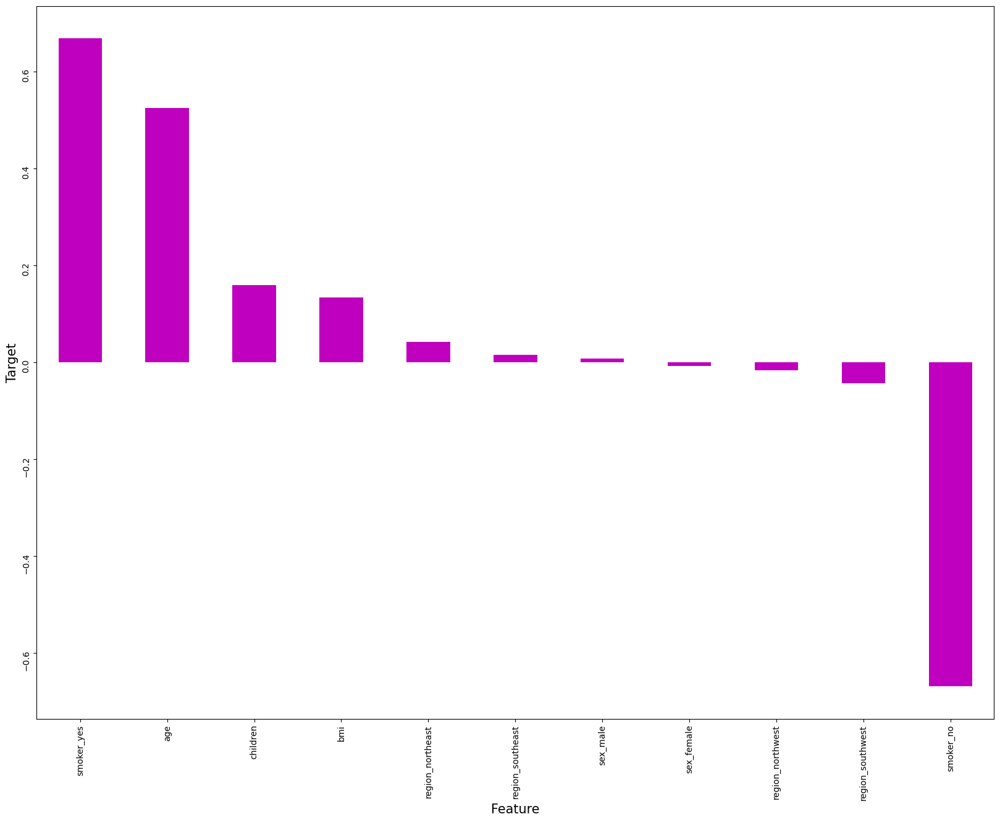

In [71]:
plt.figure(figsize = (20,15))
medicalinsurancedata_encoded.corr()['charges'].sort_values(ascending=False).drop(['charges']).plot(kind='bar',color="m")
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.yticks(rotation=90);
plt.show()

let's first scale the data before removing the desired features

In [73]:
x = medicalinsurancedata_encoded.drop("charges", axis=1)
y = medicalinsurancedata_encoded["charges"]

In [74]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,age,bmi,children,sex_female,sex_male,region_northeast,region_northwest,region_southeast,region_southwest,smoker_no,smoker_yes
0,-1.440418,-0.453160,-0.909234,1.009771,-1.009771,-0.565546,-0.565546,-0.611638,1.764609,-1.969660,1.969660
1,-1.511647,0.509422,-0.079442,-0.990324,0.990324,-0.565546,-0.565546,1.634955,-0.566698,0.507702,-0.507702
2,-0.799350,0.383155,1.580143,-0.990324,0.990324,-0.565546,-0.565546,1.634955,-0.566698,0.507702,-0.507702
3,-0.443201,-1.305052,-0.909234,-0.990324,0.990324,-0.565546,1.768203,-0.611638,-0.566698,0.507702,-0.507702
4,-0.514431,-0.292456,-0.909234,-0.990324,0.990324,-0.565546,1.768203,-0.611638,-0.566698,0.507702,-0.507702
...,...,...,...,...,...,...,...,...,...,...,...
1332,0.767704,0.050269,1.580143,-0.990324,0.990324,-0.565546,1.768203,-0.611638,-0.566698,0.507702,-0.507702
1333,-1.511647,0.206053,-0.909234,1.009771,-1.009771,1.768203,-0.565546,-0.611638,-0.566698,0.507702,-0.507702
1334,-1.511647,1.014490,-0.909234,1.009771,-1.009771,-0.565546,-0.565546,1.634955,-0.566698,0.507702,-0.507702
1335,-1.297958,-0.797524,-0.909234,1.009771,-1.009771,-0.565546,-0.565546,-0.611638,1.764609,0.507702,-0.507702


In [75]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


,VIF values,Features
0,1.016794,age
1,1.106742,bmi
2,1.004017,children
3,inf,sex_female
4,inf,sex_male
5,inf,region_northeast
6,inf,region_northwest
7,inf,region_southeast
8,inf,region_southwest
9,inf,smoker_no


VIF values are all normal. Now let's remove the desired features

In [77]:
columns_with_low_corelation_and_insignificant_VIF = ['sex_male','sex_female','region_northwest', 'region_northeast','region_southeast','region_southwest']
medicalinsurancedata_encoded = medicalinsurancedata_encoded.drop(columns=columns_with_low_corelation_and_high_VIF)

In [82]:
medicalinsurancedata_encoded

,age,bmi,children,charges,smoker_no,smoker_yes
0,19.0,27.900,0.0,1.127694,0.0,1.0
1,18.0,33.770,1.0,1.096382,1.0,0.0
2,28.0,33.000,3.0,1.109279,1.0,0.0
3,33.0,22.705,0.0,1.131374,1.0,0.0
4,32.0,28.880,0.0,1.107359,1.0,0.0
...,...,...,...,...,...,...
1333,50.0,30.970,3.0,1.121232,1.0,0.0
1334,18.0,31.920,0.0,1.099712,1.0,0.0
1335,18.0,36.850,0.0,1.095610,1.0,0.0
1336,21.0,25.800,0.0,1.098436,1.0,0.0


In [78]:
y.value_counts()

1.127694    1
1.099156    1
1.099808    1
1.129912    1
1.124128    1
           ..
1.116165    1
1.133779    1
1.134901    1
1.090897    1
1.135318    1
Name: charges, Length: 1337, dtype: int64

Let's import all the packages to do apply regression models

In [141]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor,ExtraTreesRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR

Now let's check the best r2 score including the best random state for it

In [81]:
maxaccuracy = 0
maxrandomstate = 0
for i in range(1,200):
      x_train,x_test,y_train,y_test = train_test_split(x,y, test_size = 0.30, random_state=i)
      LR = LinearRegression()
      LR.fit(x_train,y_train)
pred=LR.predict(x_test)
acc = r2_score(y_test, pred)
if acc>maxaccuracy:
    maxaccuracy=acc
    maxrandomstate=i
print("the best r2 score",maxaccuracy,"at the following random state",maxrandomstate)

the best r2 score 0.7666065706914947 at the following random state 199


In [83]:
columns_with_low_corelation_and_high_VIF = ['children','bmi']
medicalinsurancedata_encoded2 = medicalinsurancedata_encoded.drop(columns=columns_with_low_corelation_and_high_VIF)

In [84]:
x1 = medicalinsurancedata_encoded.drop("charges", axis=1)
y1 = medicalinsurancedata_encoded["charges"]

In [85]:
maxaccuracy = 0
maxrandomstate = 0
for i in range(1,200):
      x_train,x_test,y_train,y_test = train_test_split(x1,y1, test_size = 0.30, random_state=i)
      LR = LinearRegression()
      LR.fit(x_train,y_train)
pred=LR.predict(x_test)
acc = r2_score(y_test, pred)
if acc>maxaccuracy:
    maxaccuracy=acc
    maxrandomstate=i
print("the best r2 score",maxaccuracy,"at the following random state",maxrandomstate)

the best r2 score 0.7586019571144527 at the following random state 199


Now let's train model and start applying GradientBoostingRegressor, RandomForestRegressor,ExtraTreesRegressor, LinearRegression, LogisticRegression,Lasso, Ridge,DecisionTreeRegressor and SVR.

In [92]:
x_train,x_test,y_train,y_test = train_test_split(x1,y1, test_size = 0.30, random_state=maxrandomstate)

In [88]:
LinReg = LinearRegression()
LinReg.fit(x_train,y_train)
predLinReg=LinReg.predict(x_test)
predtrain=LinReg.predict(x_train)
print(r2_score(y_test, predLinReg))
print(r2_score(y_train, predtrain)*100)
print(mean_absolute_error(y_test,predLinReg))
print(mean_squared_error(y_test,predLinReg))
print(np.sqrt(mean_squared_error(y_test,predLinReg)))


0.7586019571144527
76.40170774553918
0.00390569502392688
3.8769811026994214e-05
0.006226540855643221


In [95]:
GradReg = GradientBoostingRegressor()
GradReg.fit(x_train,y_train)
predGradReg=GradReg.predict(x_test)
predtrain=GradReg.predict(x_train)
print(r2_score(y_test, predGradReg))
print(r2_score(y_train, predtrain)*100)
print(mean_absolute_error(y_test,predGradReg))
print(mean_squared_error(y_test,predGradReg))
print(np.sqrt(mean_squared_error(y_test,predGradReg)))

0.8204832540766841
88.39036926079125
0.0029223820042233875
2.8831345243870566e-05
0.005369482772471718


In [96]:
RFR = RandomForestRegressor()
RFR.fit(x_train,y_train)
predRFR=RFR.predict(x_test)
predtrain=RFR.predict(x_train)
print(r2_score(y_test, predRFR))
print(r2_score(y_train, predtrain)*100)
print(mean_absolute_error(y_test,predRFR))
print(mean_squared_error(y_test,predRFR))
print(np.sqrt(mean_squared_error(y_test,predRFR)))

0.7801082206605486
96.92190990935174
0.0032912503137122475
3.5315790589992584e-05
0.005942709027875468


In [115]:
ETR = ExtraTreesRegressor()
ETR.fit(x_train,y_train)
predETR=ETR.predict(x_test)
predtrain=ETR.predict(x_train)
print(r2_score(y_test, predETR))
print(r2_score(y_train, predtrain)*100)
print(mean_absolute_error(y_test,predETR))
print(mean_squared_error(y_test,predETR))
print(np.sqrt(mean_squared_error(y_test,predETR)))

0.7475004063297842
99.9999918429291
0.0033072979951485606
4.0552779193940944e-05
0.006368106405670444


In [106]:
Lasso = Lasso()
Lasso.fit(x_train,y_train)
predLasso=Lasso.predict(x_test)
predtrain=Lasso.predict(x_train)
print(r2_score(y_test, predLasso))
print(r2_score(y_train, predtrain)*100)
print(mean_absolute_error(y_test,predLasso))
print(mean_squared_error(y_test,predLasso))
print(np.sqrt(mean_squared_error(y_test,predLasso)))


-0.004995285643670355
0.0
0.010338575718089204
0.00016140759403711775
0.012704628842950027


In [107]:
Ridge = Ridge()
Ridge.fit(x_train,y_train)
predRidge=Ridge.predict(x_test)
predtrain=Ridge.predict(x_train)
print(r2_score(y_test, predRidge))
print(r2_score(y_train, predtrain)*100)
print(mean_absolute_error(y_test,predRidge))
print(mean_squared_error(y_test,predRidge))
print(np.sqrt(mean_squared_error(y_test,predRidge)))

0.7585862738704547
76.40122218933352
0.003907702446685313
3.877232983948673e-05
0.006226743116548709


In [108]:
DTR = DecisionTreeRegressor()
DTR.fit(x_train,y_train)
predDTR=DTR.predict(x_test)
predtrain=DTR.predict(x_train)
print(r2_score(y_test, predDTR))
print(r2_score(y_train, predtrain)*100)
print(mean_absolute_error(y_test,predDTR))
print(mean_squared_error(y_test,predDTR))
print(np.sqrt(mean_squared_error(y_test,predDTR)))

0.6322937751406346
99.9999918429291
0.003911944317133642
5.905557758811701e-05
0.007684762689121702


In [142]:
SVR = SVR(kernel='linear', C=1.0, epsilon=0.1)
SVR.fit(x_train,y_train)
predSVR=SVR.predict(x_test)
predtrain=SVR.predict(x_train)
print(r2_score(y_test, predSVR))
print(r2_score(y_train, predtrain)*100)
print(mean_absolute_error(y_test,predSVR))
print(mean_squared_error(y_test,predSVR))
print(np.sqrt(mean_squared_error(y_test,predSVR)))

-8.20203279696674e-05
-0.3796655399672666
0.010327799481035864
0.00016061849746641557
0.012673535318387509


Now let's check the cross valuation score for each regression models

In [99]:
from sklearn.model_selection import cross_val_score

In [100]:
score = cross_val_score(RFR,x,y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("r2-cv-",(r2_score(y_test,predRFR)-score.mean())*100)

[0.85046824 0.70110586 0.88242011 0.82681085 0.79145077]
0.8104511682157926
r2-cv- -3.0342947555243915


In [116]:
score1 = cross_val_score(ETR,x,y,cv=5,scoring='r2')
print(score1)
print(score1.mean())
print("r2-cv-",(r2_score(y_test,predETR)-score.mean())*100)

[0.81203056 0.66538919 0.8543617  0.79653805 0.77376777]
0.7804174550407404
r2-cv- -6.295076188600834


In [103]:
score2 = cross_val_score(GradReg,x,y,cv=5,scoring='r2')
print(score2)
print(score2.mean())
print("r2-cv-",(r2_score(y_test,predGradReg)-score.mean())*100)

[0.87630154 0.73325245 0.90104778 0.84193491 0.80321611]
0.831150559078852
r2-cv- 1.0032085860891549


In [104]:
score4 = cross_val_score(LinReg,x,y,cv=5,scoring='r2')
print(score4)
print(score4.mean())
print("r2-cv-",(r2_score(y_test,predLinReg)-score.mean())*100)

[0.79917967 0.68762222 0.83135981 0.7689159  0.73614803]
0.7646451230474998
r2-cv- -5.184921110133988


In [110]:
score5 = cross_val_score(DTR,x,y,cv=5,scoring='r2')
print(score5)
print(score5.mean())
print("r2-cv-",(r2_score(y_test,predDTR)-score.mean())*100)

[0.73020717 0.56616814 0.67948352 0.7196702  0.70387271]
0.6798803460825136
r2-cv- -17.8157393075158


In [111]:
score6 = cross_val_score(Lasso,x,y,cv=5,scoring='r2')
print(score6)
print(score6.mean())
print("r2-cv-",(r2_score(y_test,Lasso)-score.mean())*100)

[-3.46410374e-08 -2.54362262e-06 -8.85101294e-04 -8.56132145e-05
 -4.71620382e-04]
-0.00028898263084933264


TypeError: Expected sequence or array-like, got <class 'sklearn.linear_model._coordinate_descent.Lasso'>

In [112]:
score7 = cross_val_score(Ridge,x,y,cv=5,scoring='r2')
print(score7)
print(score7.mean())
print("r2-cv-",(r2_score(y_test,Ridge)-score.mean())*100)

[0.79915654 0.68771841 0.83125199 0.76891791 0.7362058 ]
0.7646501287638856


TypeError: Expected sequence or array-like, got <class 'sklearn.linear_model._ridge.Ridge'>

In [143]:
score8 = cross_val_score(SVR,x,y,cv=5,scoring='r2')
print(score8)
print(score8.mean())
print("r2-cv-",(r2_score(y_test,SVR)-score.mean())*100)

[-0.00152317 -0.00153706 -0.00077902 -0.00169144 -0.0034161 ]
-0.0017893596395104794


TypeError: Expected sequence or array-like, got <class 'sklearn.svm._classes.SVR'>

Now let's do hyperparameter tuning for the best model which is the random Forest Regressor with r2 score of 96.92190990935174 accuracy, mean absolute error of 0.0032912503137122475
, mean squared error of 3.5315790589992584e-05 , square root of mse - 0.005942709027875468 and cross value score-0.8104511682157926 with r2-cv= -3.0342947555243915.

Seconf on the list is Gradient Regression model with 88& and cross value score of 83%

In [113]:
from sklearn.model_selection import GridSearchCV

In [123]:
param = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

RF_Regressor = RandomForestRegressor()
gscv = GridSearchCV(RF_Regressor,param, cv=5)
gscv.fit(x_train, y_train)




GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]})

In [124]:
gscv.best_params_

{'max_depth': 30,
 'min_samples_leaf': 4,
 'min_samples_split': 10,
 'n_estimators': 300}

In [131]:
Selected_model=RandomForestRegressor(max_depth= 30,min_samples_leaf= 4,min_samples_split= 10,n_estimators= 300)

In [132]:
Selected_model.fit(x_train,y_train)
pred = Selected_model.predict(x_test)
print(r2_score(y_test, pred))
print(mean_absolute_error(y_test,pred))
print(mean_squared_error(y_test,pred))
print(np.sqrt(mean_squared_error(y_test,pred)))


0.8163059016771229
0.0029523705155864092
2.9502250281824562e-05
0.005431597396882851


In [ ]:
Let's save the model

In [133]:
import joblib

In [135]:
import pickle
filename='medical insurance costs.pkl'
pickle.dump(Selected_model,open(filename,'wb'))

In [ ]:
Let's load the model

In [137]:
import pickle
loaded_model=pickle.load(open('medical insurance costs.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100)

81.63059016771228


In [140]:
Conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])
Conclusion

,0,1,2,3,4,5,6,7,8,9,...,392,393,394,395,396,397,398,399,400,401
Predicted,1.130890,1.116064,1.120131,1.139747,1.103016,1.122800,1.137880,1.125431,1.121833,1.137706,...,1.101659,1.104200,1.128225,1.114983,1.124432,1.134632,1.115331,1.122929,1.138129,1.110947
Original,1.131308,1.115998,1.118212,1.140093,1.103776,1.122756,1.138358,1.124014,1.118454,1.137823,...,1.122083,1.104102,1.136462,1.115893,1.123770,1.132347,1.128707,1.122673,1.138317,1.110185


Yes we can predict the insurance costs. End of Project.

In [ ]:
#other notes

In [145]:
param = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

DT_Regressor = DecisionTreeRegressor()
gscv = GridSearchCV(DT_Regressor,param, cv=5)
gscv.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(),
             param_grid={'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]})

In [146]:
gscv.best_params_

{'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10}

In [148]:
Selected_model2=DecisionTreeRegressor(max_depth=10, min_samples_leaf= 4, min_samples_split= 10)

In [149]:
Selected_model2.fit(x_train,y_train)
pred = Selected_model2.predict(x_test)
print(r2_score(y_test, pred))
print(mean_absolute_error(y_test,pred))
print(mean_squared_error(y_test,pred))
print(np.sqrt(mean_squared_error(y_test,pred)))

0.7718194800378858
0.0035302426796457813
3.664700646793061e-05
0.006053677103044943
